<b>Son değiştirilme tarihi:23.10.2022</b>

<b>ÖNSÖZ</b>

NOT:Dokümanda zaman zaman güncellemeler olacağı için arada bir güncel versiyon kontrolü yapmanızı tavsiye ederim.

"nbviewer" üzerinden görüntülüyorsanız, dosyayı kaydetmek için sayfanın sağ üst köşesindeki download butonuna tıklayın, açılan sayfada herhangi bir yere sağ tıklayın ve farklı kaydet diyerek dosyayı istediğiniz klasöre kaydedin. Dosyayı açabilmek için Jupyter'in kurulması gerekmekte olup, yeni başlayan biriyseniz aşağıda kurulumla ilgili detayları inceleyin.

Daha önce ana dokümanın bir parçası olan Numpy ve Pandas kütüphanelerinin detaylarına <a href="https://nbviewer.org/github/VolkiTheDreamer/PythonRocks/blob/master/Python%20ile%20Veri%20Analizi%20-%20Numpy%20ve%20Pandas.ipynb">buradan</a> ulaşabilirsiniz.
<hr>

In [2]:
#Gerekli kütüphaneleri import ederek başlıyoruz
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# POKEMON data temini

Bu veri setini tekrar indiriyoruz.

In [3]:
# burdan itibaren yeni veri setimizle çalışacağız
dfp=pd.read_csv("https://raw.githubusercontent.com/VolkiTheDreamer/dataset/master/Classification/pokemon.csv",usecols=list(range(1,12))) #1-11 kolonlarını alıyoruz, ilk kolon gereksiz
dfp.head()

,Name,Type 1,Type 2,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,Bulbasaur,Grass,Poison,45,49,49,65,65,45,1,False
1,Ivysaur,Grass,Poison,60,62,63,80,80,60,1,False
2,Venusaur,Grass,Poison,80,82,83,100,100,80,1,False
3,Mega Venusaur,Grass,Poison,80,100,123,122,120,80,1,False
4,Charmander,Fire,NaN,39,52,43,60,50,65,1,False


Görsel olmayan analizleri zaten yapmıştık, tekrar yapmıyoruz. Doğrudan göreselleştirmeye geçiyoruz.

# Temel kütüphaneler

Takdir edersiniz ki burada, tüm grafik türlerini göremeyeceksiniz. Ayrıca gördüğünüz grafiklerin her parametresini de göremeyeceksiniz. Bunun için sizin biraz ellerinizi kirletmeniz gerekebilir. Neyseki, internette bol miktarda kaynak bulunuyor.

## Matplotlib

### Giriş

#### Ön bilgiler

In [4]:
%%javascript
//Bu javascript kodu ile, bazı grafikler hücreye tam sığmadığnda scroll yapma durumundan kurtarmaktadır.
//bu özelliği iptal etmek isterseniz false yerine true yazıp tekrar çalıştırın
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [5]:
plt.rcParams["figure.figsize"] = (5,3) #default figure(canvas) boyutu ayarı yapıyoruz

In [6]:
%matplotlib inline
#grafiklerin kodumuzdan hemen sonra çıkması ve notebookun bir parçası olması için

***Grafikleri 3 türlü çizebiliriz:***

* pandasın plot metodu ile, ki bu aslında plt(pyplot) nesnesi için bir wrapper metoddur. (Basit grafikler için kullanışlıdır, kullanımı sınırlıdır)
* plt(pyplot) nesnesi ile. Çoğu durumda bu yeterli olacak, zaten bu modül arka planda Ax nesnesinin metodlarını çağırmakta. Örneğin plt.xlim yazdığınızda aslında sahne arkasında ax.set_xlim() metodu çağrılır. Basit çizimler için bu yöntem tercih edilir, zira daha sadedir.
* plt ile figure nesnesi yaratıp object oriented giderek(advanced)

Biraz aşağıda detaylı örnekler olcak ama öncelikle bu 3 yönteme hızlı bi bakış atalım.

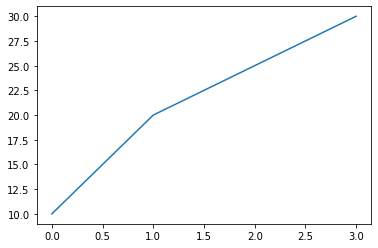

In [7]:
#1.yöntem
s=pd.Series([10, 20, 25, 30])
s.plot();

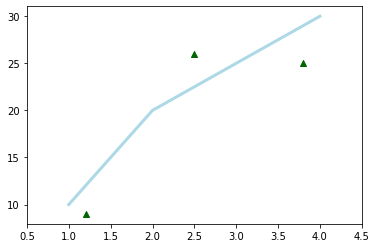

In [8]:
#2.yöntem daha sade. figure ve axes otomatik yaratılır
plt.plot([1, 2, 3, 4], [10, 20, 25, 30], color='lightblue', linewidth=3)
plt.scatter([0.3, 3.8, 1.2, 2.5], [11, 25, 9, 26], color='darkgreen', marker='^')
plt.xlim(0.5, 4.5)
plt.show();

(0.5, 4.5)

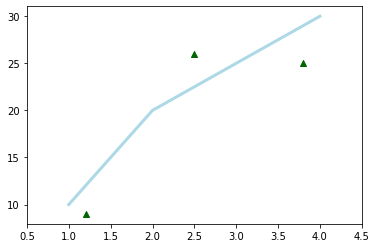

In [9]:
#3.yöntem, ax nesnesi ile
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot([1, 2, 3, 4], [10, 20, 25, 30], color='lightblue', linewidth=3)
ax.scatter([0.3, 3.8, 1.2, 2.5], [11, 25, 9, 26], color='darkgreen', marker='^')
ax.set_xlim(0.5, 4.5)
plt.show()

***x,y ve data parametreleri hakkında bir not***

Grafiklerin x ve y eksen bilgilerini farklı şekillerde belirtebiliyoruz. Çeşitli örnekler şöyle verilebilir:

* Bir dataframein kolonu üzerinden işlem yaptığımız için hiç parametre vermeksizin(x ekseni için otomatikman index kullanılır). Ör:df["kolon"].plot()
* sadece x ekseni için parametre, y için height parametresini. Ör:plt.bar(x=dfp["Name"].iloc[:50],height=dfp["Speed"].iloc[:50])
* sadece y parametresini(x ekseni için otomatikman index kullanılır) 
* xticks/yticks ile sonradan belirleme. Ör:plt.xticks(np.arange(50), dfp["Name"].iloc[:50]))
* data parametresine ilgili dataframe'i verip x ve y için kolon isimlerini. Ör:dfp.head(50).plot(kind="bar",x="Name",y="Speed",figsize=(20,5))

Detaylı örnekleri ise aşağıda bulacaksınız.

***Diğer parametreler hakkında bir not***

Her parametre her zaman kullanılabilir durumda olmayabilmekte, seçilen grafiğin türüne göre bazı parametreler kullanılabilir hale gelmektedir.

#### pandas'ın plot metodu ile

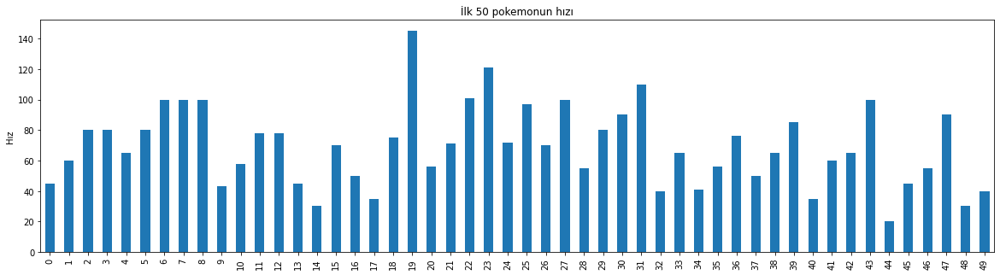

In [10]:
dfp["Speed"].iloc[:50].plot(kind="bar",figsize=(20,5)) #default tür line'dır. bu sırada plt nesnesi oluşur
plt.title("İlk 50 pokemonun hızı")
plt.ylabel("Hız")
plt.show();

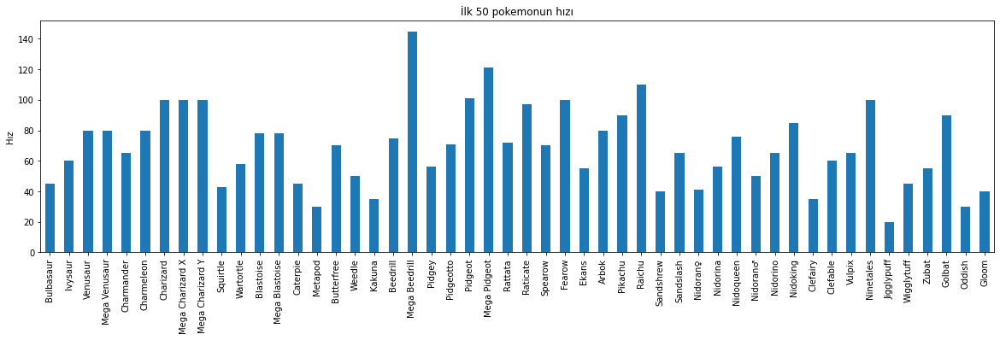

In [11]:
#bir kolona uygulanıyorsa X eksenini belirtmek için plt.xticks uygulanır, aksi halde yukarıdaki gibi indeksler görünür
dfp["Speed"].iloc[:50].plot(kind="bar",figsize=(20,5)) #default tür line'dır. bu sırada plt nesnesi oluşur
plt.xticks(np.arange(50), dfp["Name"].iloc[:50])
plt.title("İlk 50 pokemonun hızı")
plt.ylabel("Hız")
plt.show();

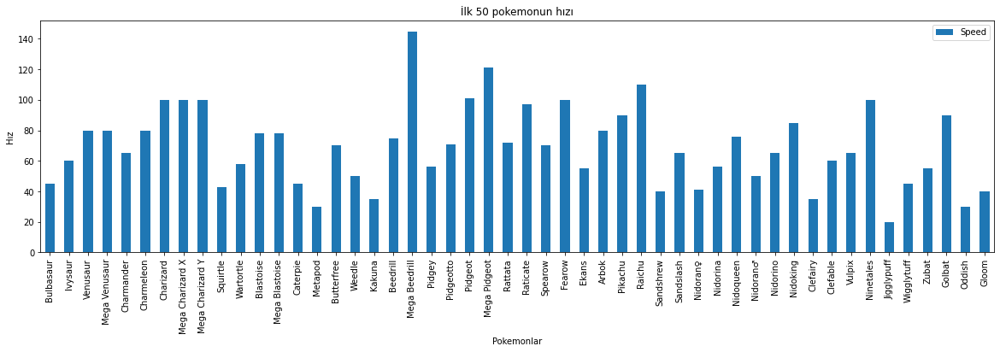

In [12]:
#veya tüm dfp üzerine uygulayıp x ve y'yi ayrıca belirtiriz
dfp.head(50).plot(kind="bar",x="Name",y="Speed",figsize=(20,5)) #grafiği bu satır çizer ve bu sırada bir plt nesnesi oluşur
plt.title("İlk 50 pokemonun hızı") #ancak diğer özellikler için, bir üstte oluşan plt'nin metodlarını çağırıyoruz
plt.xlabel("Pokemonlar")
plt.ylabel("Hız")
plt.show();

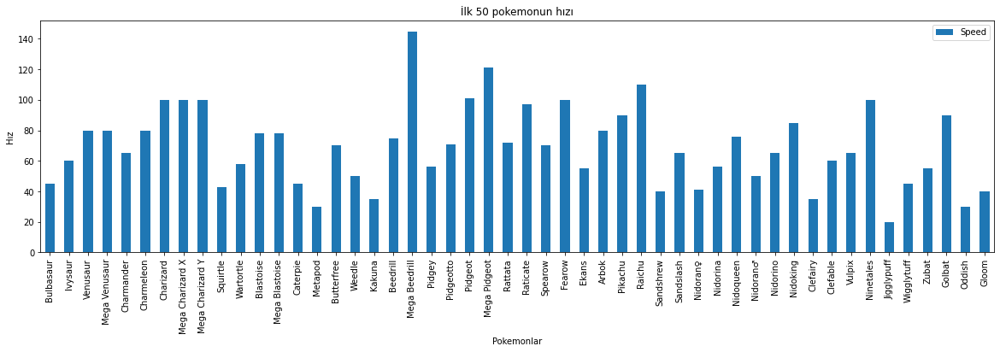

In [13]:
#veya zincirileme şekilde
dfp.head(50).plot.bar(x="Name",y="Speed",figsize=(20,5)) #grafiği bu satır çizer ve bu sırada bir plt nesnesi oluşur
plt.title("İlk 50 pokemonun hızı") #ancak diğer özellikler için, bir üstte oluşan plt'nin metodlarını çağırıyoruz
plt.xlabel("Pokemonlar")
plt.ylabel("Hız")
plt.show();

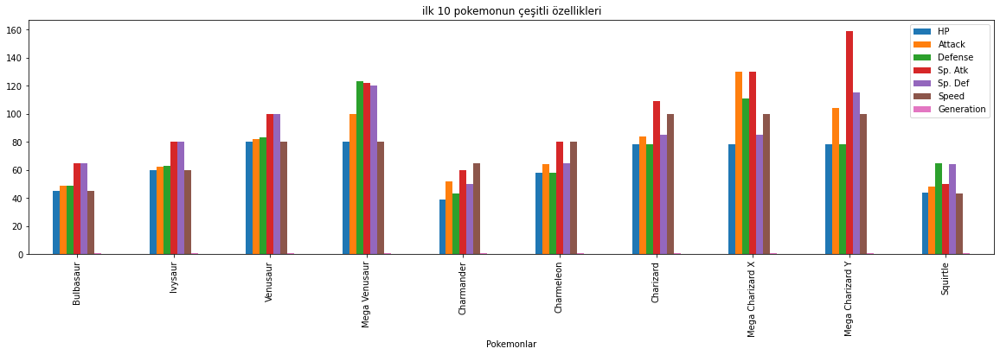

In [14]:
#y belirtmezsek tüm featurelar için çizer
dfp.head(10).plot.bar(x="Name",figsize=(20,5)) #grafiği bu satır çizer ve bu sırada bir plt nesnesi oluşur
plt.title("ilk 10 pokemonun çeşitli özellikleri")
plt.xlabel("Pokemonlar")
plt.show();

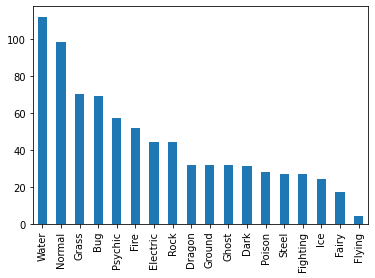

In [15]:
#yukarıdaki örneklerde, hep bir kolon üzerinden gittik, kolon verdiğimiz için bunlar y eksenini adresliyordu. x ekseni
#için bizim ayrıca parametre vermemiz gerekti,aksi halde indeks değerleri görünüyordy.Şimdi ise yine bir Seriyi çizdireceğiz
#ve yine x eksenini belirtemeyeceğiz, ancak bu sefer indeksler farklı olacak, sayılar değil Type 1 isimleri.
dfp["Type 1"].value_counts().plot(kind="bar")
plt.show();

#### pyplot(plt) nesnesi ile

Yukarıdaki belirttiğimiz gibi, bu yöntemle çalışırken arka planda ya yeni bir Figure/Axes ikilisi oluşmakta veya, mevcuttaki bir Figure/Axes ile çalışılmaktadır. object oriented kısımda göreceğimiz gibi ax nesnesinin tüm setter ve getter metodlarının plt içinde bir karşılığı vardır. Ör: ax.set_title() için plt.title(). Bu konuda çok detaylı ve anlaşılır açıklamaları https://realpython.com/python-matplotlib-guide/ safyasında bulabilirsiniz.

Grafik türlerini kendi ismine ait metodla çizdiriyoruz.

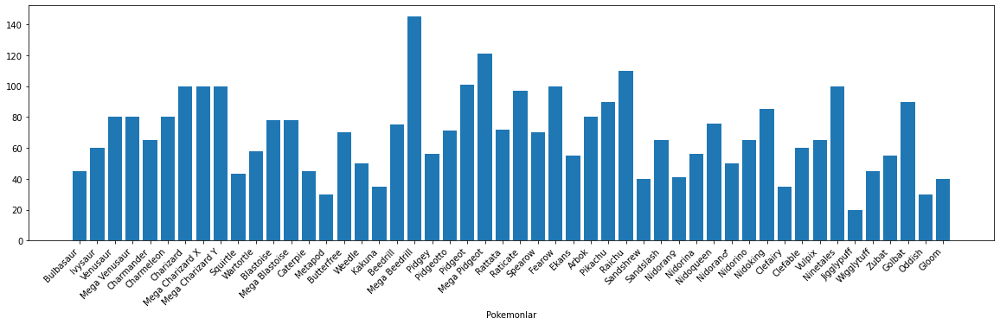

In [16]:
plt.figure(figsize=(20,5))
plt.bar(x=dfp["Name"].iloc[:50],height=dfp["Speed"].iloc[:50]) #bar plot
plt.xlabel("Pokemonlar")
plt.xticks(rotation= 45,horizontalalignment="right")
plt.show();

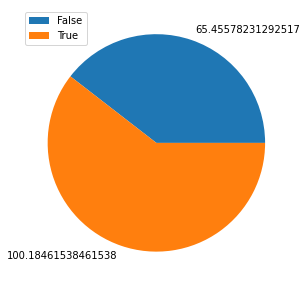

In [17]:
plt.figure(figsize=(20,5))
grup=dfp.groupby("Legendary")
plt.pie(x=grup["Speed"].mean(),labels=grup["Speed"].mean())
plt.legend(grup.groups.keys(),loc='upper left')
plt.show();

#### figure ile object oriented

Nesne hiyerarşisini sözel anlatmaya geçmeden önce https://realpython.com/python-matplotlib-guide/ sayfasından aldığım şu görseli ve https://matplotlib.org/examples/showcase/anatomy.html  sayfasından aldığım bir alttaki görseli inceleyelim. İlk linkteki sayfa nesne modeli hakkında çok faydalı(teknik ve teorik) bilgiler vermekte, ilgisi olanlar inceleyebilir.

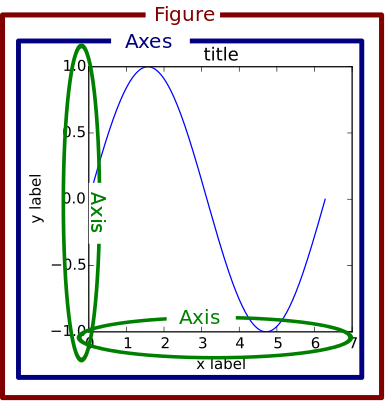

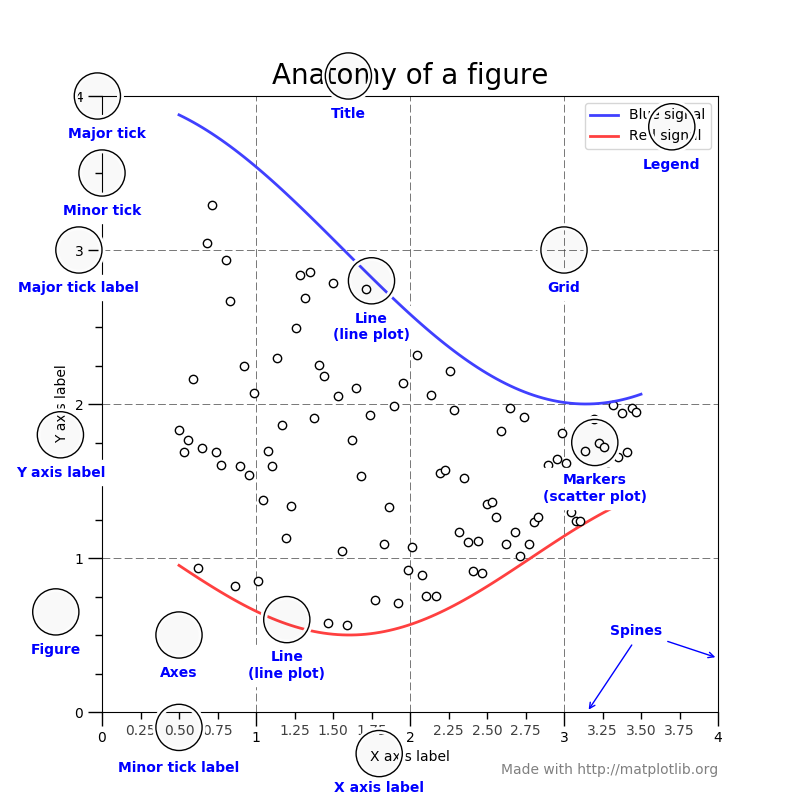

Bu son yöntemin güzelliği şu, figure nesnesi üzerinde tam kontrolümüz bulunur.

<b>Figure nesnesi:</b> Bu, grafiğin üzerinde duracağı canvastır, grafiğin taşıyıcısı olarak düşünülebilir.<br>
<b>Ax nesnesi:</b> Bu ise, grafiğin kendisidir. Figure içine ilk bu eklenir.

***eksenler hakkında***

Her Ax nesnesinin bir x ekseni(axis) bir de y ekseni bulunur, bunlar tick'leri içerir ve bunlar da major/minor tickline'lar ile ticklabellara sahiptir. 

Yani şöyle bir hiyerarşiden bahsedeviliriz: 

<pre><b>figure > ax(es) > axis > tick > tickline + ticklabel
                       > axislabel
                       > title
                       > legend
</b></pre>

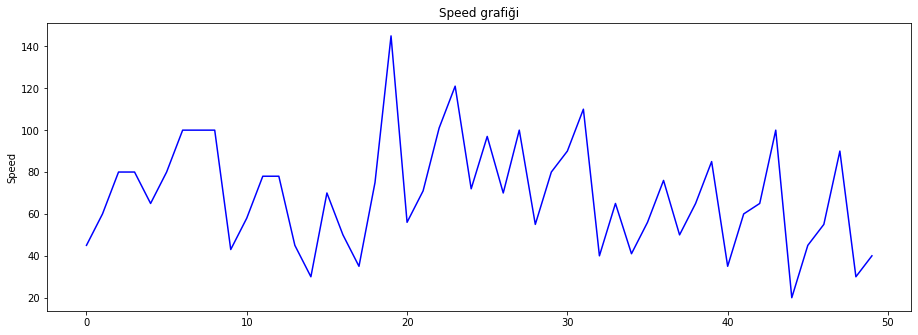

In [18]:
# boş bir canvas(figure) yaratalım
fig = plt.figure(figsize=(15,5))

# bu canvasa grafik nesnesini(axes ya da plot) yerleştirelim 
axes = fig.add_axes([0.1, 0.1, 0.8, 0.8]) # add_axess dışında başka yöntemler de var, aşağıda göreceğiz

# grafiği çizdirelim
axes.plot(np.arange(50), dfp["Speed"].iloc[:50], c='b')
axes.set_ylabel('Speed')
axes.set_title('Speed grafiği')
plt.show();

### Farklı bar chart örnekleri

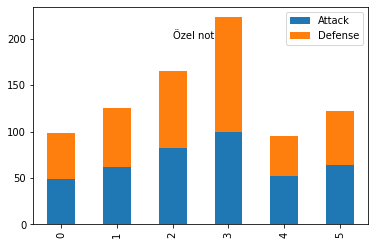

In [19]:
dfp.loc[:5,"Attack":"Defense"].plot.bar(stacked=True) #grafik türü bar olunca stacked parametresi var oluyor
plt.annotate(xy=[2,200], text="Özel not") #grafiğin belirli bir noktasına not koyabiliyoruz
plt.show();

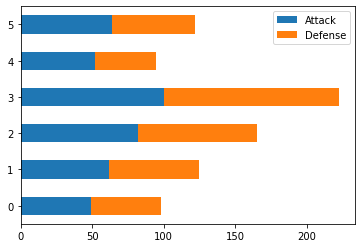

In [20]:
dfp.loc[:5,"Attack":"Defense"].plot(kind="barh",stacked=True) #diğer yöntemle de olur, bu arada yatay bar için barh
plt.show();

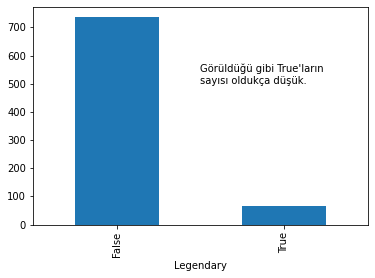

In [21]:
#count plot
dfp.groupby('Legendary')['HP'].count().plot(kind='bar') #sns.countplot alternatifi.herhangi bir kolona göre count alınabilir
plt.annotate(xy=[0.5,500], text="Görüldüğü gibi True'ların \nsayısı oldukça düşük.")
plt.show();

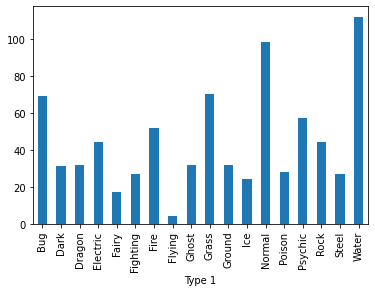

In [22]:
#bir kolona göre gruplayıp adetleri çizme
dfp.groupby("Type 1").size().plot(kind="bar")
plt.show();

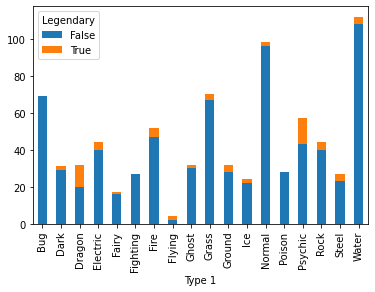

In [23]:
#Bir kolona göre gruplayıp başka bir kolondaki kategorileri stack grafik yapma: önce unstack,sonra stacked chart 
dfp.groupby(['Type 1','Legendary']).size().unstack().plot(kind='bar',stacked=True)
plt.show();

### Pie chart 

<AxesSubplot:ylabel='Speed'>

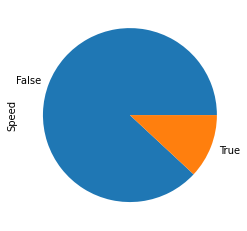

In [24]:
dfp.groupby("Legendary")["Speed"].sum().plot.pie()
plt.show()

### Scatter chart

özellikle korelasyon görmek için faydalı bir grafik türüdür

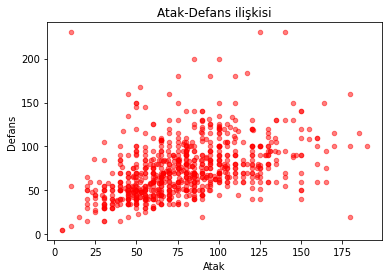

In [25]:
#x=attack, y=defense, ikisi arasındaki korelasyonu gösterecek
dfp.plot(kind="scatter",x="Attack", y="Defense", color="r",alpha=0.5)
plt.xlabel("Atak")
plt.ylabel("Defans")
plt.title("Atak-Defans ilişkisi")

plt.show();

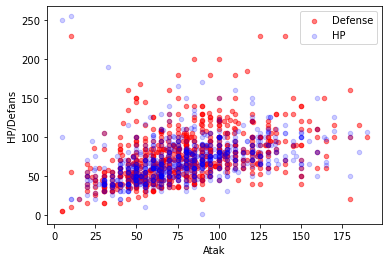

In [26]:
#aynı chart içine başka bir dağılım yerleştirebiliriz, bunun için ax parametresine ilk grafiği atamak yeterlidir
#bu yöntem add_axes/add_subplot  yönteminden farklıdır. Burada aynı ax içine ikinci bir plot çizilmektedir
c1=dfp.plot(kind="scatter",x="Attack", y="Defense", color="r",alpha=0.5)
dfp.plot.scatter(x="Attack", y="HP", color="b",alpha=0.2,ax=c1)

plt.xlabel("Atak")
plt.ylabel("HP/Defans")
plt.legend(["Defense","HP"],loc="best")
plt.show();

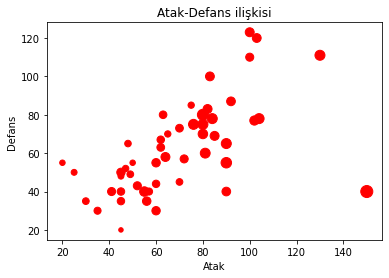

In [27]:
#s parametresi ile bubblechart. 
d=dfp.iloc[:50,:]
d.plot(kind="scatter",x="Attack", y="Defense", color="r",s=d["Speed"]) #Speed değerlerine göre
plt.xlabel("Atak")
plt.ylabel("Defans")
plt.title("Atak-Defans ilişkisi")

plt.show();

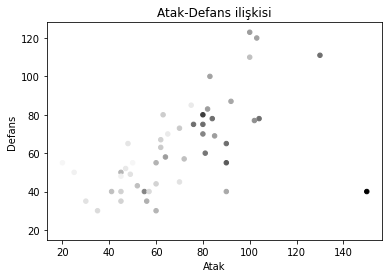

In [28]:
#color parametresine bir kolonu atayarak renk yoğunluğundan anlam çıkarma
d=dfp.iloc[:50,:]
d.plot(kind="scatter",x="Attack", y="Defense", color=d["Speed"]) #Speed değerlerine göre
plt.xlabel("Atak")
plt.ylabel("Defans")
plt.title("Atak-Defans ilişkisi")

plt.show();

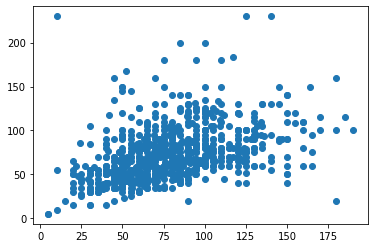

In [29]:
#veya doğrudan plt nesnesi ile
plt.scatter(x=dfp["Attack"], y=dfp["Defense"])

### Histgoram

<AxesSubplot:ylabel='Frequency'>

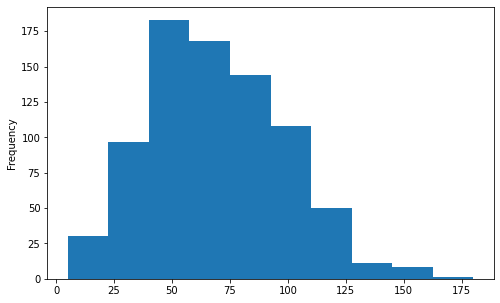

In [30]:
#Histogram for Seri
dfp["Speed"].plot(kind="hist",bins=10,figsize=(8,5))
plt.show()

<AxesSubplot:ylabel='Frequency'>

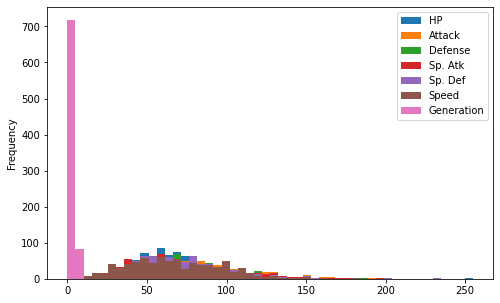

In [31]:
#histogram for DF. Tüm df için histogram çıkarmanın daha güzel yolunu az sonra göreceğiz
dfp.plot(kind="hist",bins=50,figsize=(8,5))
plt.show()

DF.plot.hist() -->plot(kind="hist") ile aynı:DF'nin tüm kolonları için tek bir grafikte histgoramları çizer. tüm kolonlar benzer skladaysa bu faydalı olabilir, aksi halde biraz karmaşık görünebilir.

DF.hist() -->her bir kolon için ayrı bir küçük histogram yapar.

<AxesSubplot:ylabel='Frequency'>

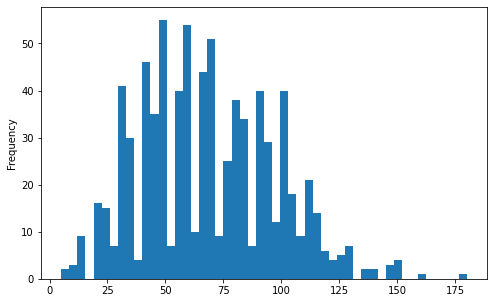

In [32]:
#Seri.plot.hist()
dfp["Speed"].plot.hist(bins=50,figsize=(8,5))
plt.show()

bize hem dağı

<AxesSubplot:>

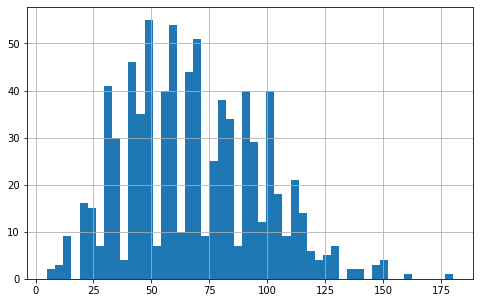

In [33]:
#Seri.hist()
dfp["Speed"].hist(bins=50,figsize=(8,5)) #bunda gridler de görünüyor
plt.show()

<AxesSubplot:ylabel='Frequency'>

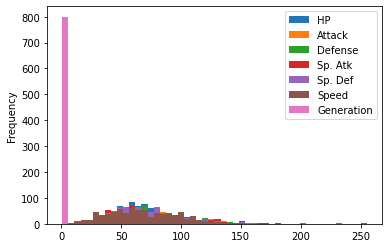

In [34]:
#df.plot.hist()
dfp.select_dtypes(np.number).plot.hist(bins=50)
plt.show()

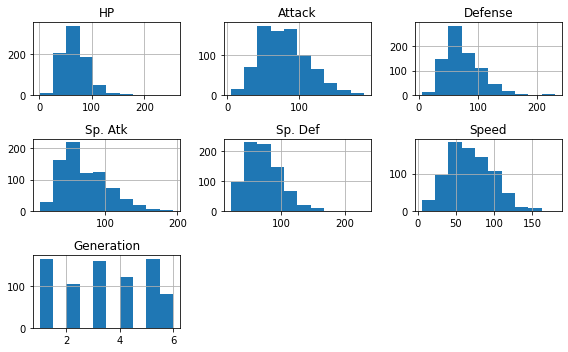

In [35]:
#df.hist()
dfp.select_dtypes(np.number).hist(figsize=(8,5))
plt.tight_layout()
plt.show();

<AxesSubplot:ylabel='Frequency'>

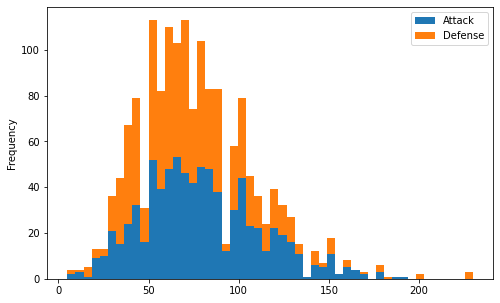

In [36]:
#histogramların da stacked özelliği var
dfp[["Attack","Defense"]].plot.hist(bins=50,stacked=True,figsize=(8,5))
plt.show()

### boxplot

Histogramda outlierları(uç değerler) görebiliyorduk ancak boxplotlar bu amaç için daha uygun, üstelik mediana göre konumlarını da daha rahat görebiliyoruz. Outlierlar için, genelde %10-%90 percentileların dışı veya Q1(lower quartile) ile Q3ten(upper quartile) 1,5 IQR(Q3-Q1) mesafe uzaklıktan itibaren olan noktlar seçilebilmektedir. Pythondaki görselleştirme küptüphaneler genelde 1,5 IQR formülüne göre hareket eder. 

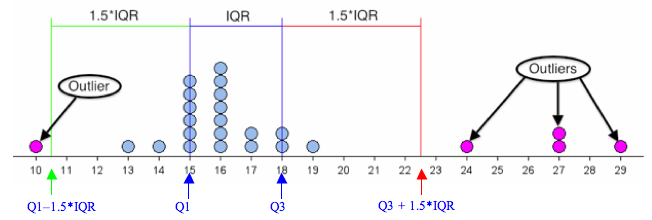

<AxesSubplot:>

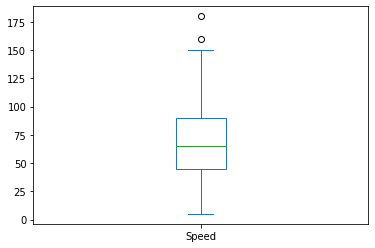

In [37]:
dfp["Speed"].plot.box()
plt.show()
#kutunun üstü Q3ü yani %75 percentili, kutu içindeki çizgi %50yi, kutu altı %25(Q1)i
#kutunun biraz üstündeki çizgi Q3+1.5*IQR değeri verir, en alt çizgi Q1-1.5*IQR'ı verir
#(varsa) yuvarlak halkalar ise outlierları verir

<AxesSubplot:>

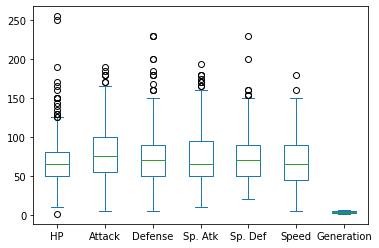

In [38]:
#tüm df
dfp.plot.box()
plt.show()

<AxesSubplot:>

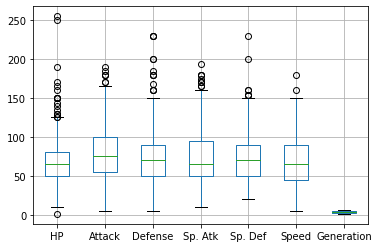

In [39]:
#veya
dfp.select_dtypes(np.number).boxplot()
plt.show()

### yoğunluk analizi(kde)

Histograma göre avantajları olan bir grafik türüdür. detaylar için <a href="https://towardsdatascience.com/histograms-and-density-plots-in-python-f6bda88f5ac0">buraya</a> bakabilirsiniz.

<AxesSubplot:ylabel='Density'>

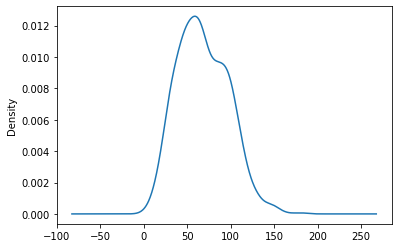

In [40]:
dfp["Speed"].plot.kde()
plt.show()

### pdf(probability density function) ve cdf(cummulative distributive function)

Text(0.5, 0, 'Speed')

pdf: [0.0375  0.12125 0.22875 0.21    0.18    0.135   0.0625  0.01375 0.01
 0.00125]
binler: [  5.   22.5  40.   57.5  75.   92.5 110.  127.5 145.  162.5 180. ]
cdf: [0.0375  0.15875 0.3875  0.5975  0.7775  0.9125  0.975   0.98875 0.99875
 1.     ]


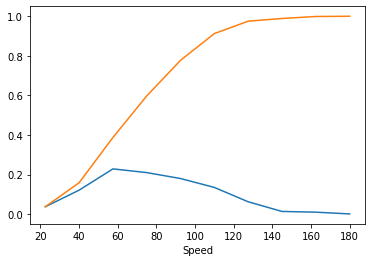

In [41]:
counts, binler=np.histogram(dfp["Speed"],bins=10,density=True)
plt.xlabel("Speed")
pdf=counts/(sum(counts))
print("pdf:",pdf)
print("binler:",binler)

cdf=np.cumsum(pdf)
print("cdf:",cdf)
plt.plot(binler[1:],pdf)
plt.plot(binler[1:],cdf)
plt.show()

### Scatter matrix plot

Matplotlib içinde değildir ama burda yer vermek istedim. Tüm kolonları birbiriyle scatter grafik yapar.Seaborndaki pairplotun muadilidir ama daha hızlı çalışır.

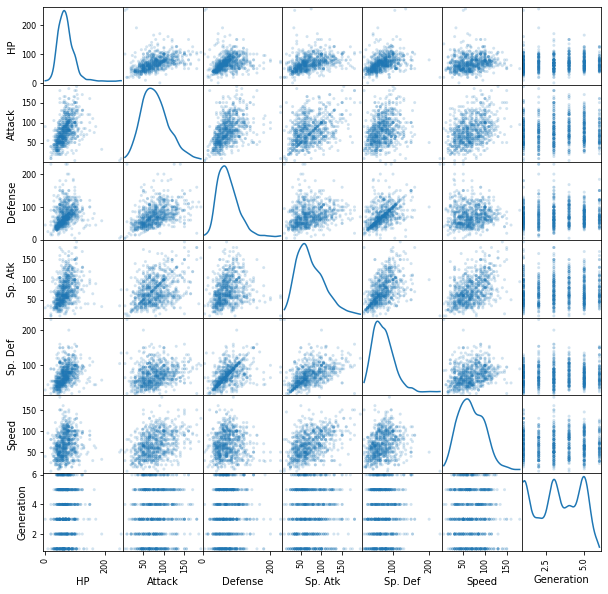

In [42]:
from pandas.plotting import scatter_matrix #diğerlerinden farklı bir 
scatter_matrix(dfp.select_dtypes(np.number), alpha=0.2, figsize=(10, 10), diagonal='kde')
plt.show();

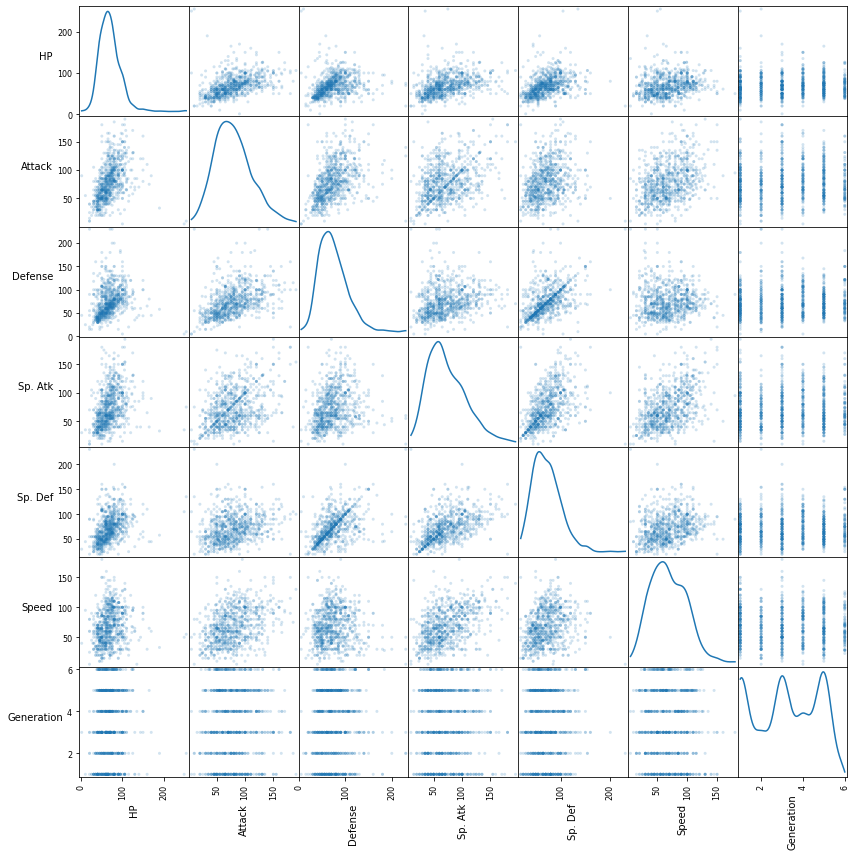

In [44]:
#axislerdeki labelların oryantasyonunu değiştirelim
from pandas.plotting import scatter_matrix
axes=scatter_matrix(dfp[dfp.select_dtypes("number").columns], alpha=0.2, figsize=(12, 12), diagonal='kde');
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

### Contour

https://matplotlib.org/stable/gallery/index.html#images-contours-and-fields

### Birden fazla grafik çizme

https://stackoverflow.com/questions/45765735/arranging-multiple-for-loop-categorical-plots-with-seaborn?noredirect=1&lq=1

#### Tüm dataframe için grafik çizdirme

Bu yöntemi görmüştük. Çok kalabalık olmayacaksa uygundur.

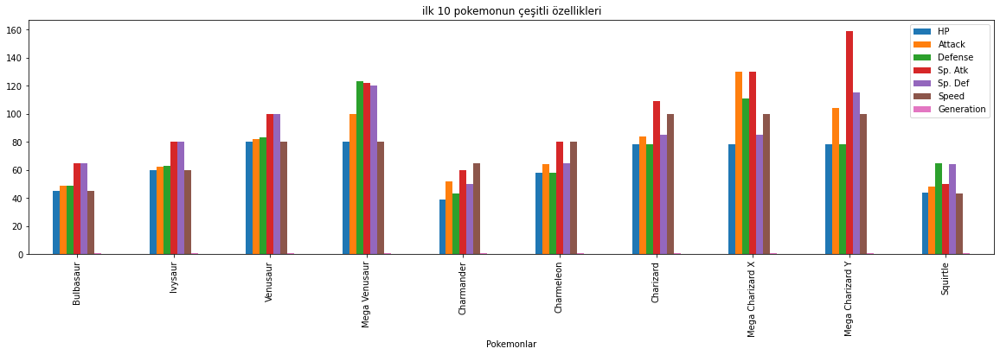

In [45]:
dfp.head(10).plot.bar(x="Name",figsize=(20,5))
plt.title("ilk 10 pokemonun çeşitli özellikleri")
plt.xlabel("Pokemonlar")
plt.show();

#### plt ile arka arkaya çizdirilen ax'lar

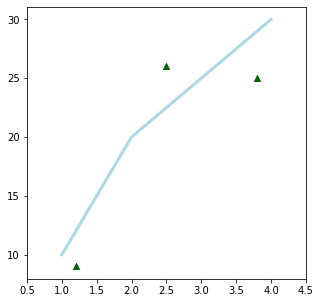

In [46]:
plt.figure(figsize=(5,5))
ax1=plt.plot([1, 2, 3, 4], [10, 20, 25, 30], color='lightblue', linewidth=3) #ax1= demeye gerek yoktu, olur da kullanırsak diye atadık
ax2=plt.scatter([0.3, 3.8, 1.2, 2.5], [11, 25, 9, 26], color='darkgreen', marker='^')
plt.xlim(0.5, 4.5)
plt.show();

#### fig.add_axes, plt.axes

Bu yöntemde grafik(axes) canvas üzerinde "mutlak" koordinatlara konumlandırılır. Sırayla `sol, alt, genişlik, yükseklik`.  Bu yöntemle aynı canvas(figure) içine birden çok ax çizilir. Hem y hem x ekseni farklı skalada olan değişkenler için uygundur.

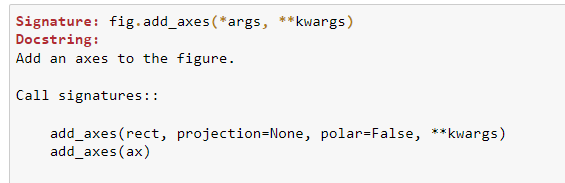

Text(0, 0.5, 'Speed')

Text(0.5, 1.0, 'Speed grafiği')

Text(0, 0.5, 'HP')

Text(0.5, 1.0, 'HP grafiği')

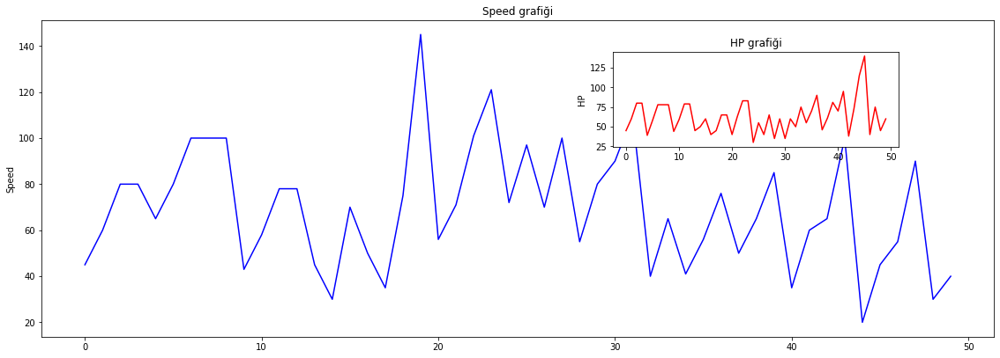

In [47]:
#Şimdi bu figure içine ikinci bir iç grafik yerleştirebiliriz
fig = plt.figure(figsize=(15,5))

axes1 = fig.add_axes([0.1, 0.1, 1, 1]) # ana axes
axes2 = fig.add_axes([0.7, 0.7, 0.3, 0.3]) # iç axes

axes1.plot(np.arange(50), dfp["Speed"].iloc[:50], 'b')
axes1.set_ylabel('Speed')
axes1.set_title('Speed grafiği')

axes2.plot(np.arange(50), dfp["HP"].iloc[:50], 'r')
axes2.set_ylabel('HP')
axes2.set_title('HP grafiği')
plt.show()

Görüldüğü üzere, bu yöntemde grafiklerin sabit konumları belirtilebildiği için, içiçe grafik gösterme durumlarında en uygun çözüm olmaktadır. Bunun dışında pratikte daha çok **add_subplot** yöntemi kullanılmaktadır.

<Axes:>

(array([0.00129808, 0.00064904, 0.00259616, 0.00194712, 0.00194712,
        0.00356972, 0.00454328, 0.00941108, 0.01590148, 0.02531255,
        0.03147843, 0.03926691, 0.05127415, 0.0652285 , 0.0733415 ,
        0.10384637, 0.1288344 , 0.1418152 , 0.15252436, 0.16485611,
        0.17913499, 0.19244031, 0.21320958, 0.20412302, 0.18465183,
        0.19114223, 0.17816143, 0.16518063, 0.1320796 , 0.11552909,
        0.10254829, 0.08859394, 0.06912274, 0.05841358, 0.04510827,
        0.03245199, 0.02206735, 0.0178486 , 0.01362984, 0.00746396,
        0.00454328, 0.00227164, 0.00097356, 0.00194712, 0.00097356,
        0.00064904, 0.00097356, 0.        , 0.        , 0.00032452]),
 array([-2.08259154, -1.77444404, -1.46629653, -1.15814903, -0.85000153,
        -0.54185403, -0.23370653,  0.07444098,  0.38258848,  0.69073598,
         0.99888348,  1.30703099,  1.61517849,  1.92332599,  2.23147349,
         2.539621  ,  2.8477685 ,  3.155916  ,  3.4640635 ,  3.77221101,
         4.08035851,  4.38

<Axes:>

((array([-3.81060943, -3.58545756, -3.46184782, ...,  3.46184782,
          3.58545756,  3.81060943]),
  array([-2.08259154, -2.07728738, -1.87066897, ..., 12.32711238,
         12.33610886, 13.32478358])),
 (1.98630136240057, 5.04107855137412, 0.9999220614788427))

Text(0.5, 1.0, 'Normal Q-Q plot')

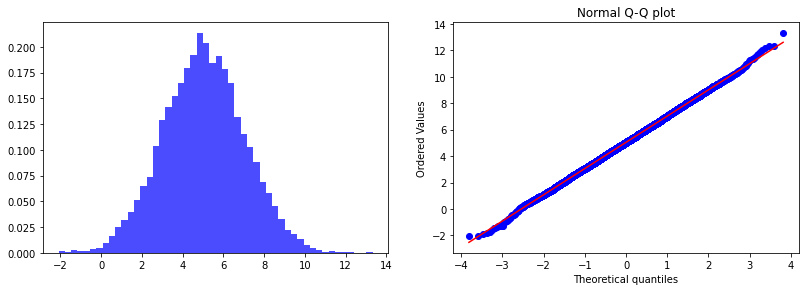

In [48]:
import scipy.stats as stats
plt.axes([0.1,0.01,0.8,0.8]) #ilk grafiğin konumu
y = np.random.normal(5.0, 2.0, size=10000)
plt.hist(y, bins=50, density=True, facecolor="blue", alpha=0.7)

plt.axes([1.05,0.01,0.8,0.8]) #ikinci grafiğin konumu
stats.probplot(y, dist="norm", plot=plt)
plt.title("Normal Q-Q plot")
plt.show()

#### fig.add_subplot, plt.subplot, plt.subplots

plt.subplots()=fig.subplots()...Bunda ise bir grid tasarlayıp, bu gridin hangi bölgesine hangi grafiği yerleştireceğimizi belirtiyoruz. Örneğin ilk 2*2'lik bir matrisin sol üstü(1 numaralı) gibi

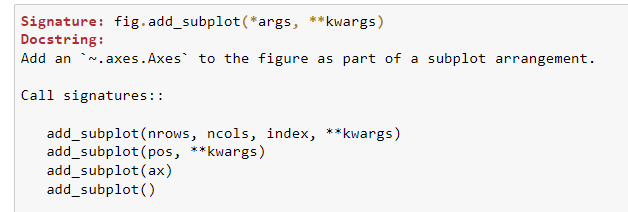

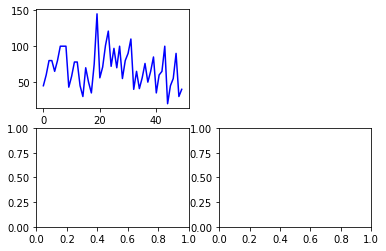

In [49]:
fig = plt.figure()
ax1 = fig.add_subplot(2, 2, 1) #veya kısaca add_subplot(221)--> 2x2'lik matrisin 1 numaralı gözüne yerleşir
ax1.plot(np.arange(50), dfp["Speed"].iloc[:50], 'b') #sadece ilkine bi plot çizdirelim
#ax2 = fig.add_subplot(2, 2, 2) #burayı çizdirmeyebiliyoruz ve boş görünüyor
ax3 = fig.add_subplot(2, 2, 3) #--> 2x2'lik matrisin 3 numaralı gözüne yerleşir
ax4 = fig.add_subplot(224)

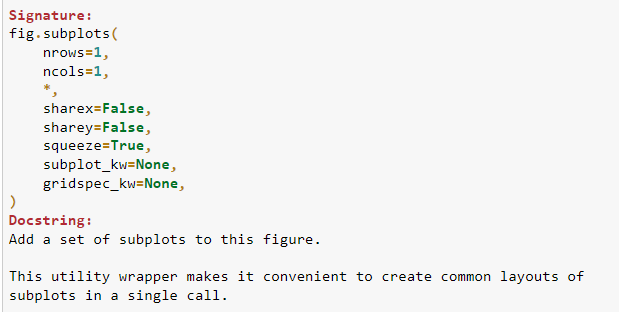

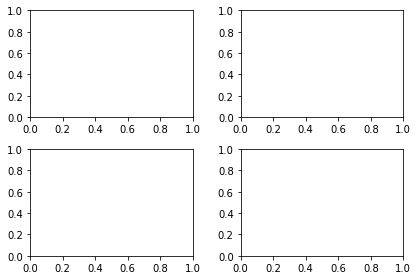

In [50]:
#yukarıdaki önce figure oluşturup sonra add_subplot diyorduk. bunun tek satıra indirgenmiş hali
fig, axes = plt.subplots(nrows=2, ncols=2) #axes'lere dizi gibi ulaşabilirsin axes[0,1] gibi
plt.tight_layout()

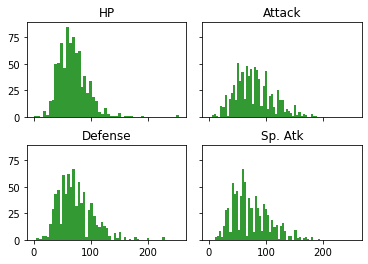

In [51]:
# içiçe iki döngü ile ilerleyip ilave bir iterative k değişkeni ile kolonlarda dolaşabiliriz
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True) #eksen etiketleri tekrar etmesin diye son iki parametre
k=0
for i in range(2):
    for j in range(2):
        axes[i, j].hist(dfp.iloc[:,k+3], bins=50, color='g', alpha=0.8) #HP, Attack, Defense, Sp.Atk
        axes[i, j].set_title(dfp.columns[k+3])
        k+=1
plt.subplots_adjust(wspace=0.1, hspace=0.3);

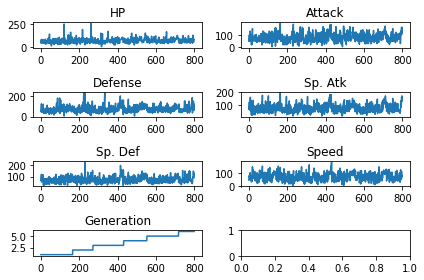

In [52]:
#veya tek bir for döngüsü kullanabiliriz ancak bu sefer ax'ları flat etmemiz gerekiyor.Burda ax parametresini kullanıyoruz
_, axes=plt.subplots(nrows=4,ncols=2) #figure'ü kullanmayacağımız için fig değişkeni yerine _ kullanabiliriz
axes_list = [item for sublist in axes for item in sublist] 

#7 kolon var, 8.ye plot ederken hata almayalım diye try blocku kullanırız
try:
    for e,ax_ in enumerate(axes_list):
        kolonad=dfp.select_dtypes(np.number).columns[e]
        dfp[kolonad].plot(ax=ax_)
        ax_.set_title(kolonad)
except:
    pass

plt.tight_layout()
plt.show();

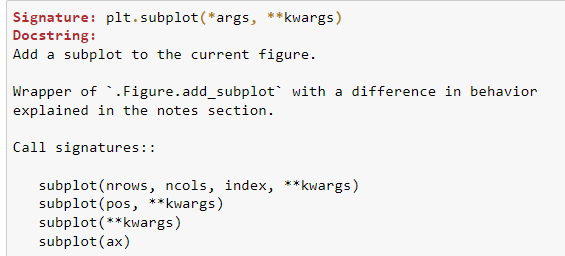

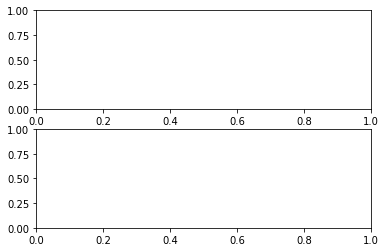

In [53]:
#yukarıdaki yöntemin bir de aşağıdaki hali var. Bunu da görün istedim ama yukarıdakini tercih edin.
fig = plt.figure() 
ax1 = plt.subplot(2,1,1) 
# (2,1,1) indicates total number of rows, columns, and figure number respectively
ax2 = plt.subplot(2,1,2)

**Döngüsel subplot**

aynı plot or not, lplt show dışardaysa aynı ploota, ieçrdeyse altalta

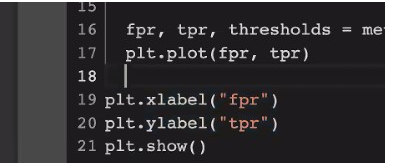

In [54]:
dizi1=np.random.randint(1,10000,20).reshape(2,10)
dizi2=np.random.randint(1,10000,20).reshape(2,10)
dizi3=np.random.randint(1,10000,20).reshape(2,10)
dizi4=np.random.randint(1,10000,20).reshape(2,10)
diziler=[dizi1,dizi2,dizi3,dizi4]

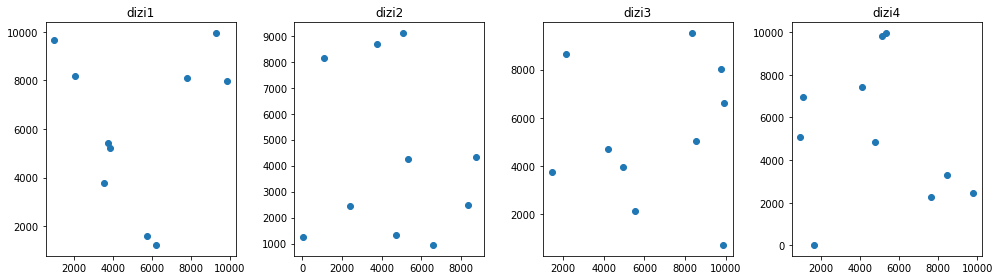

In [85]:
plt.figure(figsize=(14,4))
for e,dizi in enumerate(diziler):
    plt.subplot(1,4,e+1) # 2x2 için plt.subplot(2,2,e+1)
    plt.scatter(dizi[0],dizi[1])  
    plt.title("dizi"+str(e+1))
plt.tight_layout()    
plt.show();    

olur da bu çizimleri altalta görmek isterseniz, subplot demeden ve **plt.show** ifadesini loop içine koyarak yapabilirsiniz.

<Figure size 432x288 with 0 Axes>

Text(0.5, 1.0, 'dizi1')

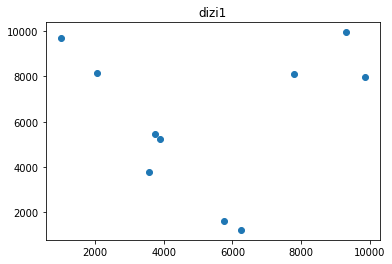

Text(0.5, 1.0, 'dizi2')

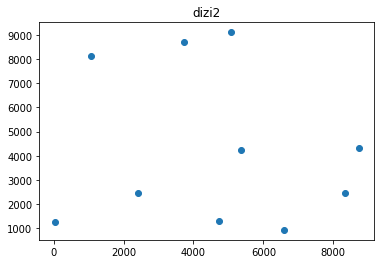

Text(0.5, 1.0, 'dizi3')

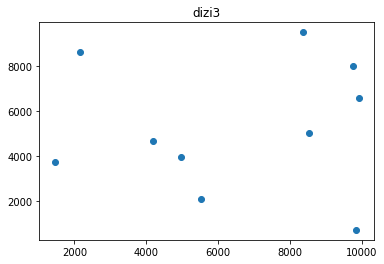

Text(0.5, 1.0, 'dizi4')

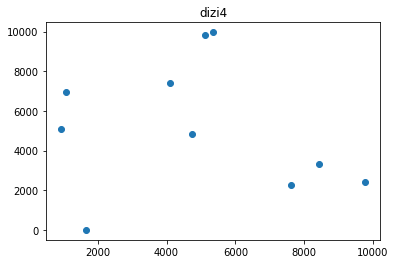

In [83]:
plt.figure()
for e,dizi in enumerate(diziler):
    plt.scatter(dizi[0],dizi[1])  
    plt.title("dizi"+str(e+1)) 
    plt.show();  

Text(0.5, 1.0, 'dizi4')

Text(0.5, 1.0, 'dizi4')

Text(0.5, 1.0, 'dizi4')

Text(0.5, 1.0, 'dizi4')

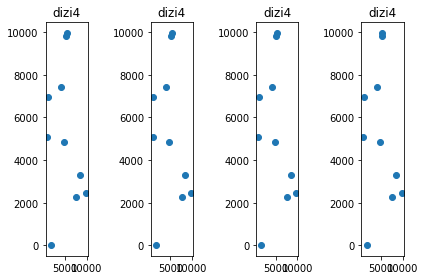

In [56]:
#bunu şöyle de yapabilirdik
fig, axes = plt.subplots(nrows=1, ncols=4)
for i in range(4):
    axes[i].scatter(dizi[0],dizi[1])  
    axes[i].set_title("dizi"+str(e+1))    
plt.tight_layout()

Not: Eğer tek satırda yanyana gösterim yapacsaksanız axes'i tek boyutla kullanın. axes[0] gibi. axes[0,0] derseniz hata verir

#### Subplots parametresi

Bununla her bir kolon için subplot yapılır. Aynı df'nin farklı kolonlarını yapmak için yukardaki yötnemlere göre daha pratik.

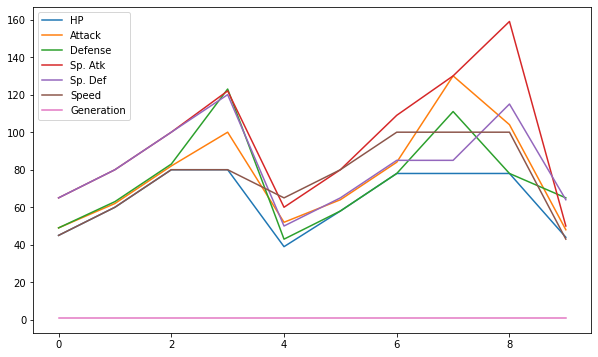

In [57]:
#tümünü tek grafikte göstermek karışık bir görüntüye sebep verir
dfp.head(10).plot(figsize=(10, 6))
plt.show();

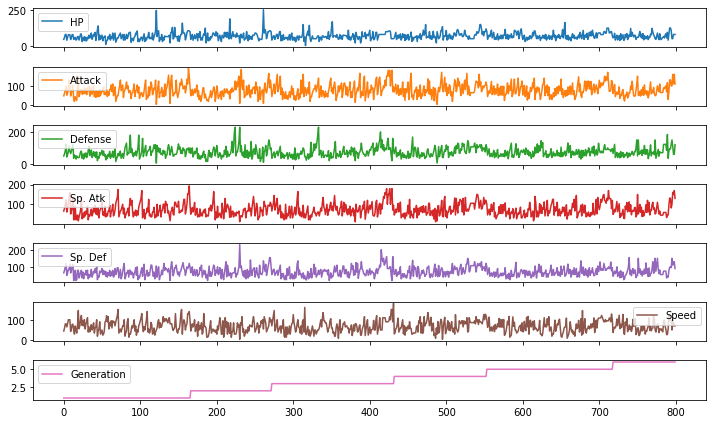

In [58]:
#subplot ile daha anlaşılır bir görüntü
dfp.plot(subplots=True, figsize=(10, 6))
plt.tight_layout() #grafikler içiçe girmesin, kargacık burgacık görünmesin
plt.show();

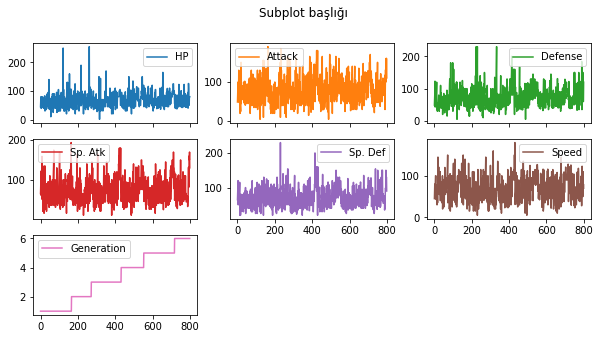

In [59]:
#layout girilerek matrisyel bir görünüm sağlanabilir
dfp.plot(subplots=True, layout=(3,3), figsize=(10, 5)) #4,2 veya 2,4 tam olur, 3,3te bi boş yer kalıyor
plt.suptitle("Subplot başlığı") #tüm grafikleri temsile eden üst başlık(super title)
plt.show();

#### ax parametresiyle ax paylaşma

Bu yöntemde tek canvas ve tek ax vardır. hem x hem y eksenleri aynıdır. Benzer değişkenler için kullanımı uygundur. İkinci grafiğin ax paramtresine ilk grafiğin kendisine ait değişken verilir.

<AxesSubplot:xlabel='Yıllar'>

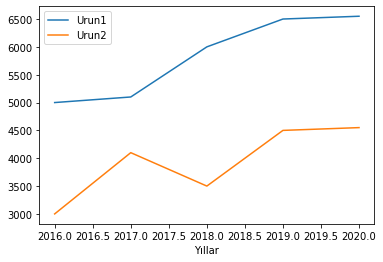

In [60]:
dict_={"Yıllar":[2016,2017,2018,2019,2020],
      "Cirolar":[5000,5100,6000,6500,6550]
      }
dftarihsel=pd.DataFrame(dict_)
c1=dftarihsel.plot(x="Yıllar",y="Cirolar",label="Urun1")

dict2={"Yıllar":[2016,2017,2018,2019,2020],
      "Cirolar":[3000,4100,3500,4500,4550]
      }
dftarihsel2=pd.DataFrame(dict2)
dftarihsel2.plot(x="Yıllar",y="Cirolar",ax=c1,label="Urun2")
plt.show()

#### subplot2grid 

Bu yöntemle aynı canvas(figure) içine birden çok ax çizilir. Subplottan farkı, ax'ların boyutlarını belirleyebilmemiz.

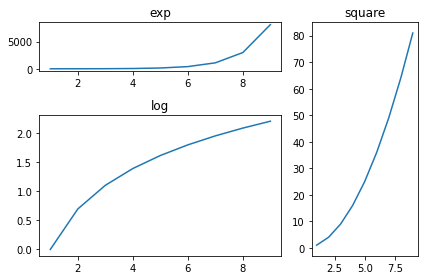

In [61]:
a1 = plt.subplot2grid((3,3),(0,0),colspan = 2)
a2 = plt.subplot2grid((3,3),(0,2), rowspan = 3)
a3 = plt.subplot2grid((3,3),(1,0),rowspan = 2, colspan = 2)
import numpy as np
x = np.arange(1,10)
a2.plot(x, x*x)
a2.set_title('square')
a1.plot(x, np.exp(x))
a1.set_title('exp')
a3.plot(x, np.log(x))
a3.set_title('log')
plt.tight_layout()
plt.show();

#### iki eksenli grafik

Bu yöntemde aynı ax içine y eksenleri farklı iki grafik çizilir. X ekseni aynı, y ekseni farklı skalada olan değişkenler için uygundur.

<AxesSubplot:>

<AxesSubplot:>

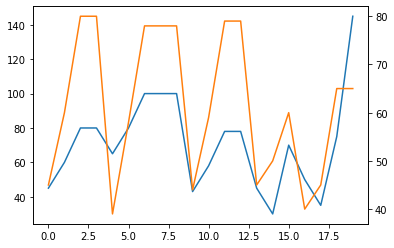

In [62]:
#sadece iki line chart olacaksa ve bi seri üzerine uygulacayaksak en basit hali şöyle
dfp["Speed"].head(20).plot()
dfp["HP"].head(20).plot(secondary_y=True)
plt.show()

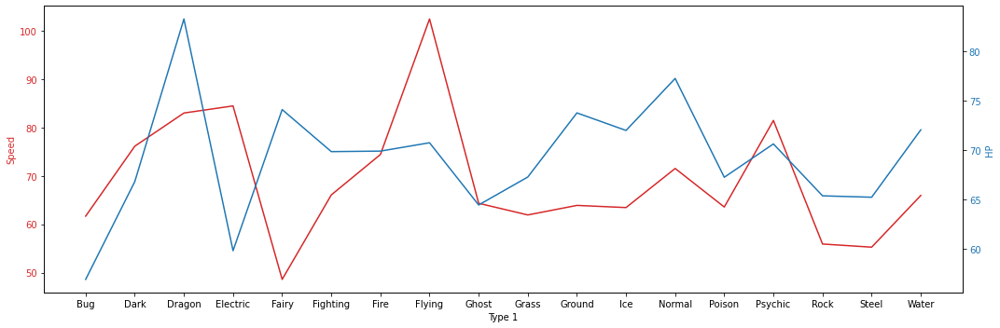

In [73]:
#daha komplike ama her tür durum için olan çözüm şöyle
fig, ax1 = plt.subplots(figsize=(15,5))
data=dfp.groupby("Type 1")[["HP","Speed"]].mean()

color = 'tab:red'
ax1.set_xlabel('Type 1')
ax1.set_ylabel('Speed', color=color)
ax1.plot(data.index, data.Speed, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx() 

color = 'tab:blue'
ax2.set_ylabel('HP', color=color) 
ax2.plot(data.index, data.HP, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout() 
plt.show();

#### Seaborn FacetGrid

Aşağıda göreceğiz

### Diğer hususlar

#### output cell'deki matplotlib açıklamlalarını gizleme

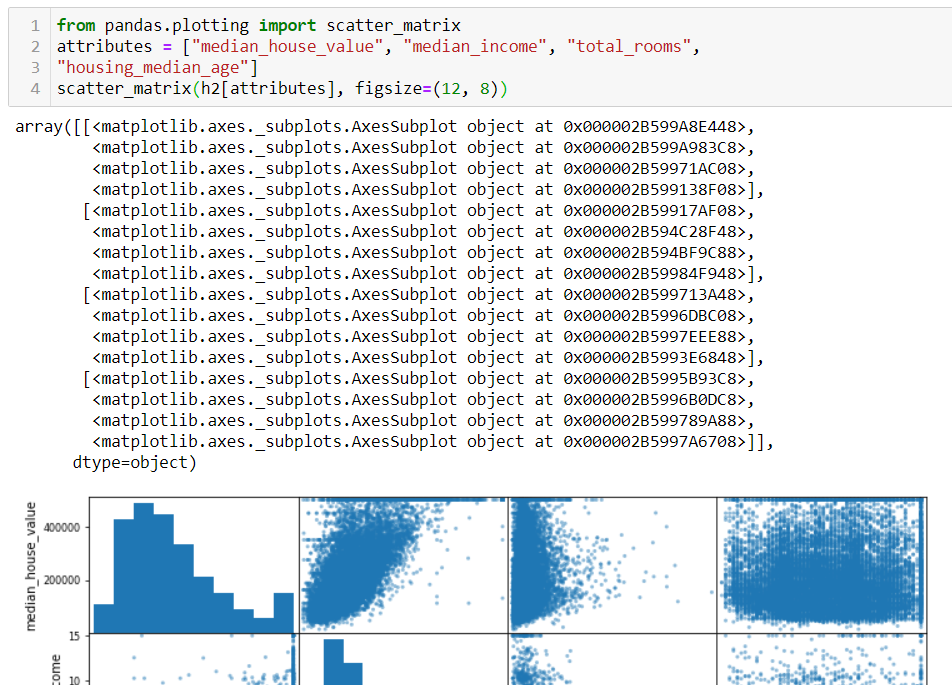

grafik satırının sonuna ";" koymanız yeterlidir.

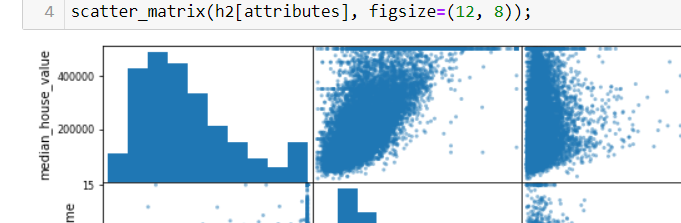

Bazı durumlarda ise en sona `plt.show();` demek gerekebilmektedir.

Bunun da işe yaramadığı durumlar olabilmektedir. O zaman şu yöntemi deneyin:

<pre>
_ = plt.hist(rakamalr,bins='auto');
plt.show()
</pre>

#### Yoğunluk belirtme

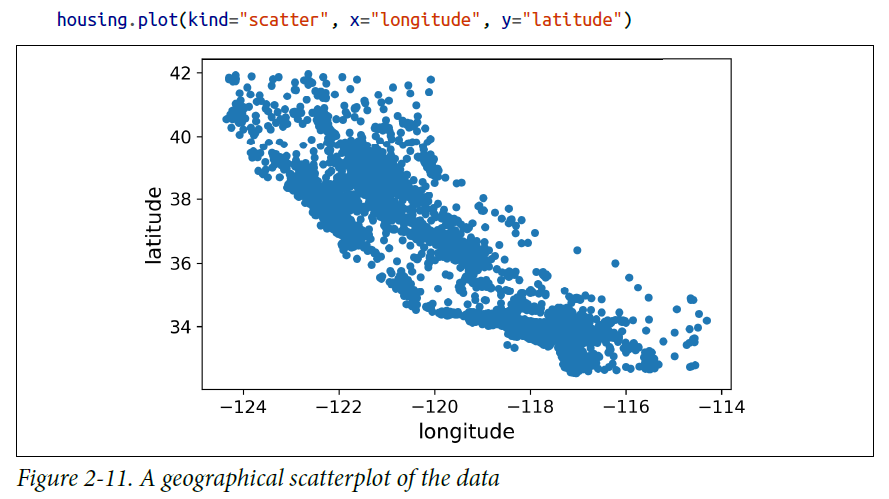

alpha parametresi verildiğinde: **housing.plot(kind="scatter", x="longitude", y="latitude", alpha=0.1)**
sonuç şöyle:

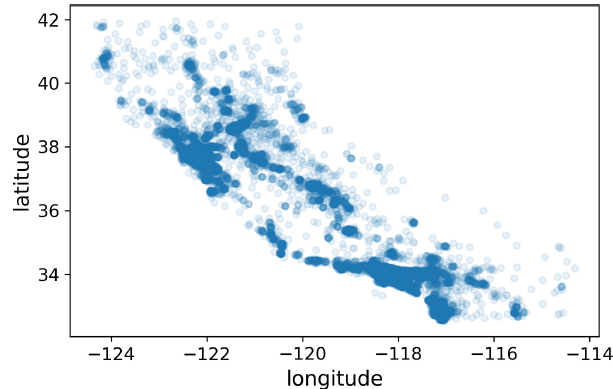

Bir diğer yöntem de hexbin tipli grafik çizdirmektir

#### Colormap değiştirme

https://stackoverflow.com/questions/20040597/matplotlib-change-colormap-after-the-fact

#### stil uygulama

In [87]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


In [88]:
plt.style.use('ggplot')

#### figsize

Bir grafiğin default boyutu 6,4*4,8'dir. Bunların birimi de inch'tir.

Tek bir grafiğin boyutunu değiştirmek için, ilgili satırın öncesinde `plt.figure(figsize=(w,h))` yazmak yeterlidir.

Bazen figure size belirttiğiniz halde istediğiniz olmuyor veya figsize belirtmek istediğiniz fonksiyon bu parametreyi almıyor olabilir. Böyle durumlarda aşağıdaki komutu güvenle verebilirsiniz.

In [89]:
plt.rcParams["figure.figsize"] = (15,5) #veya plt.rc('figure', figsize=(15,5))

In [90]:
#çözünürlük için
plt.rcParams['figure.dpi']=300

In [91]:
#mevcuttakini öğrenmek için
plt.rcParams.get('figure.figsize')

[15.0, 5.0]

`rcParams`'ı tabiki başka ayarlamalar içn de kullanabiliriz. Detaylar şurada: https://matplotlib.org/stable/tutorials/introductory/customizing.html 

In [92]:
plt.rcParams['ytick.labelsize'] =12 #veya plt.rc('ytick', labelsize=12)

Bazı durumlarda ise, mesela seaborn'un figure-level chart tiplerinde(catplot, lmplot, jointplot gibi) **height ve aspect** değerlerini vermek gerekebilir.

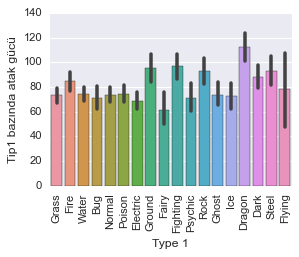

In [116]:
height=3; width=4
g=sns.catplot(x="Type 1",y="Attack",data=dfp,kind="bar", height=height, aspect=width/height);
g.set_ylabels("Tip1 bazında atak gücü");
plt.xticks(rotation= 90);

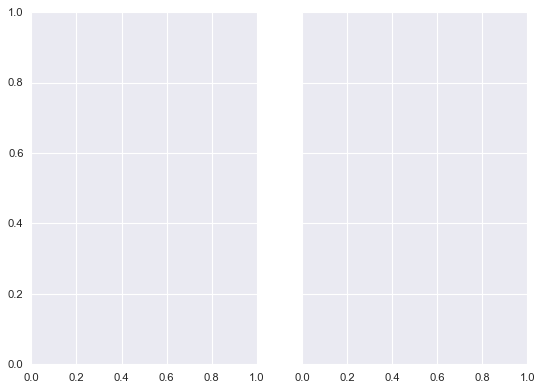

In [117]:
#A figure with multiple columns will have the same overall size, but the axes will be squeezed horizontally to fit in the space:
f, ax = plt.subplots(1, 2, sharey=True)

#### Legend

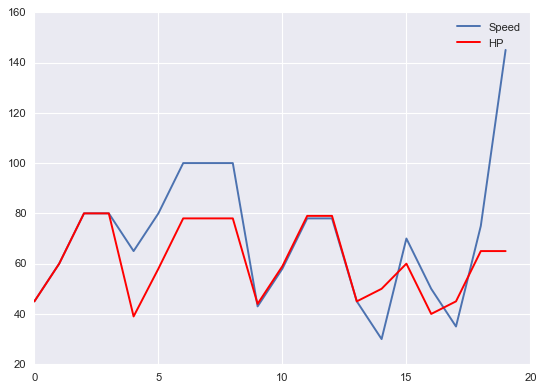

In [120]:
#aynı figurede birden fazla plot çizdin, legend verceksin
dfp["Speed"].head(20).plot()
dfp["HP"].head(20).plot(color="r")
plt.legend(["Speed","HP"]); #sırasını bilmen lazım

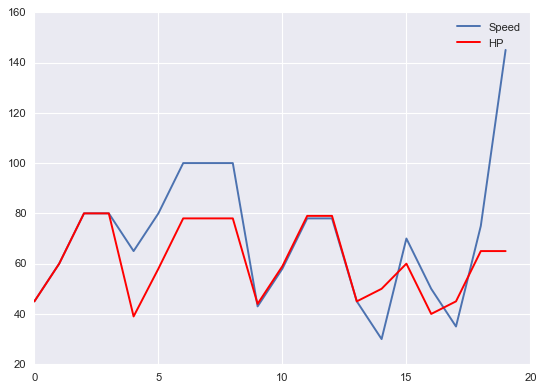

In [121]:
#veya
dfp["Speed"].head(20).plot(label="Speed")
dfp["HP"].head(20).plot(label="HP",color="r")
plt.legend();

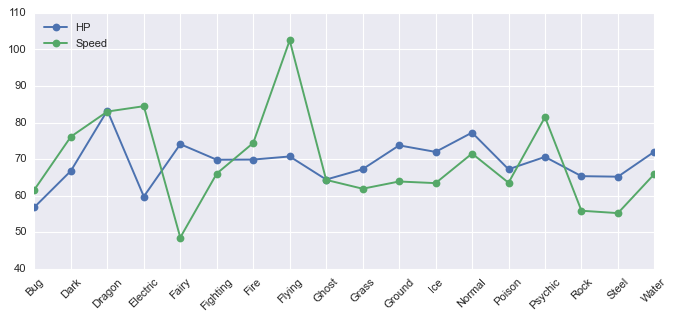

In [115]:
#veya
data=dfp.groupby("Type 1")[["HP","Speed"]].mean()
plt.style.use('seaborn')
plt.figure(figsize=(10,4))
plt.plot(data,marker="o")
plt.xticks(rotation=45)
plt.legend(data.columns,loc="upper left");

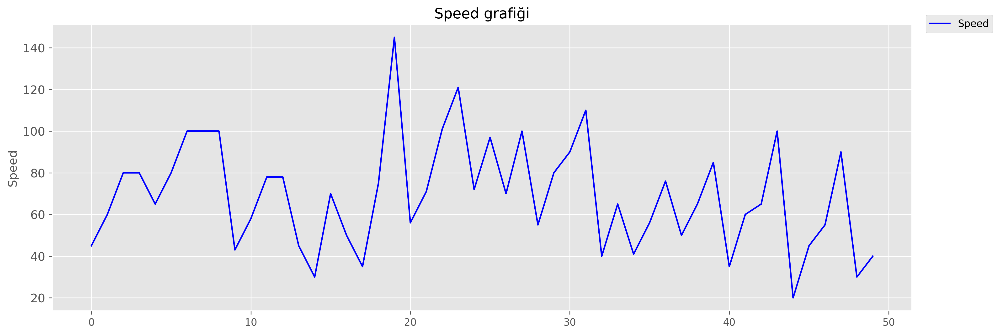

In [99]:
#legendı chart dışına alma
fig = plt.figure(figsize=(15,5))
axes = fig.add_axes([0.1, 0.1, 0.8, 0.8])
axes.plot(np.arange(50), dfp["Speed"].iloc[:50], c='b',label="Speed")
axes.set_ylabel('Speed')
axes.set_title('Speed grafiği')
axes.legend(bbox_to_anchor=(1.1, 1.05)) # bu satırla dışarı alıyoruz
plt.show();

#### subplot'un özelliklerine erişim ve bunları değiştirme

ax nesnesinin metodlarını kullanırız. Biraz sonra deaha detaylı bilgiler bulunuyor.

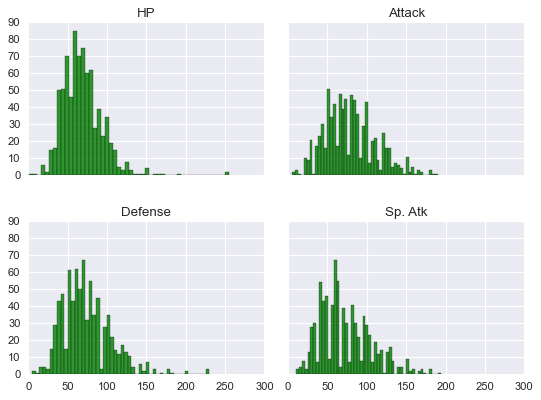

In [147]:
#örneğin subplot içindeki chartların x eksenindeki labelların rotation'ını değiştirmek için
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True) #eksen etiketleri tekrar etmesin diye son iki parametre
k=0
for i in range(2):
    for j in range(2):
        axes[i, j].hist(dfp.iloc[:,k+3], bins=50, color='g', alpha=0.8) #HP, Attack, Defense, Sp.Atk
        axes[i, j].set_title(dfp.columns[k+3])    
        k+=1
plt.subplots_adjust(wspace=0.1, hspace=0.3);

#### ax nesnesinin üyelerine değer atama

ax'ın üyelerine bi değer atamak için `set` metodu kullanılabilir. Bunula beraber 
<a href="https://stackoverflow.com/questions/13399293/the-preferred-way-to-set-matplotlib-figure-axes-properties">şurada</a> bu metodların kullanım şekliyle ilgili şöyle bi açıklama mevcut 
 
    Pyplot tutorial appears to recommend ax.set_xxx() functions, but also mentions .setp(xxx=).
    On the other hand, .set(xxx=) function is not used and .setp(xxx=), while documented, is not used in any examples (Pyplot API).
    I understand it that matplotlib supports both imperative programming style and matlab-like style. Reason being the target user bases -- those already familiar with Python and those who used Matlab before.
    I conclude that matplotlib recommended api is .set_xxx().

    ax.set_xlim(4) and ax.set(xlim=4) are ultimately the same thing, so do what you like. ax.set(kwarg=foo) calls ax.set_kwarg(foo) via some string manipulation, as you can see if you look at the source. The various setter functions are mostly one-liners, as well, but exist to allow for the introspective setp to work.

Yukarıdaki örnekle devam edelim

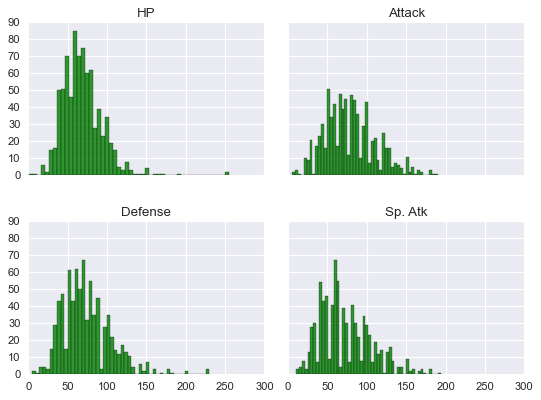

In [148]:
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True) #eksen etiketleri tekrar etmesin diye son iki parametre
k=0
for i in range(2):
    for j in range(2):
        axes[i, j].hist(dfp.iloc[:,k+3], bins=50, color='g', alpha=0.8) #HP, Attack, Defense, Sp.Atk
        axes[i, j].set(title=dfp.columns[k+3]) #set_title yerine bunu yazdık       
#         axes[i, j].tick_params(labelrotation=45)
#         axes[i, j].set_xticklabels(labels, rotation=45)
#         axes[i, j].set_xticks(np.arange(300))
#         axes[i, j].set_xticklabels(np.arange(300),rotation=45)
        k+=1
plt.subplots_adjust(wspace=0.1, hspace=0.3);

In [ ]:
#gca ile current axis
plt.gca().set_ylim(0, 1)

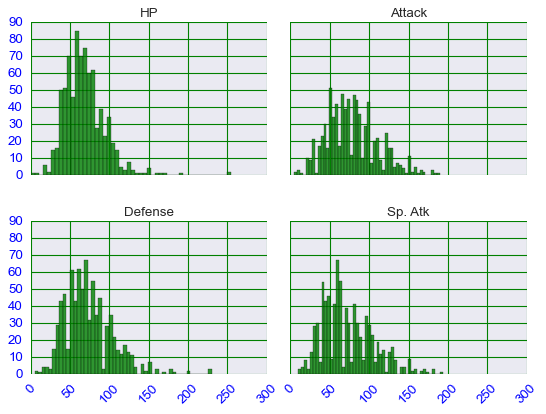

In [164]:
#tick_params ile tek veya iki eksende toplu tick bilgisi atama
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True) #eksen etiketleri tekrar etmesin diye son iki parametre
k=0
for i in range(2):
    for j in range(2):
        axes[i, j].hist(dfp.iloc[:,k+3], bins=50, color='g', alpha=0.8) #HP, Attack, Defense, Sp.Atk
        axes[i, j].set(title=dfp.columns[k+3]) #set_title yerine bunu yazdık 
        axes[i, j].tick_params(colors='b', grid_color='g',labelsize=12) #iki eksende de
        axes[i, j].tick_params(axis="x",labelrotation=45) #sadece x ekseninde
        k+=1
plt.subplots_adjust(wspace=0.1, hspace=0.3);

#### yatay/dikey çizgi çekme

Bazı grafiklerde belli noktalardan yatay/dikey çizgiler geçirmek isteyebilrisiniz. Ör:Ortalama çizigisi, veya belli bir thresholdu belirlemek için.

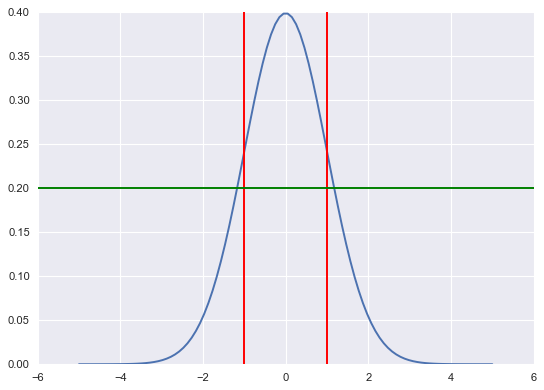

In [166]:
import scipy.stats as stats
dist = stats.norm(0,1)
x = np.linspace(-5, 5, 100)
y = dist.pdf(x)
plt.plot(x, y)
plt.axvline(x=-1, color='red')
plt.axvline(x=1, color='red')
plt.axhline(y=0.2, color='green')
plt.show();

#### Widgetlar ile interaktif grafikler

In [170]:
# !pip install ipympl

In [171]:
%matplotlib widget

In [172]:
import ipywidgets as widgets

In [173]:
def say_my_name(name):
    """
    Print the current widget value in short sentence
    """
    print(f'My name is {name}')
     
widgets.interact(say_my_name, name=["Jim", "Emma", "Bond"]);

My name is Jim


In [174]:
def say_something(x):
    """
    Print the current widget value in short sentence
    """
    print(f'Widget says: {x}')
    
widgets.interact(say_something, x=[0, 1, 2, 3])
widgets.interact(say_something, x=(0, 10, 1))
widgets.interact(say_something, x=(0, 10, .5))
_ = widgets.interact(say_something, x=True)

Widget says: True


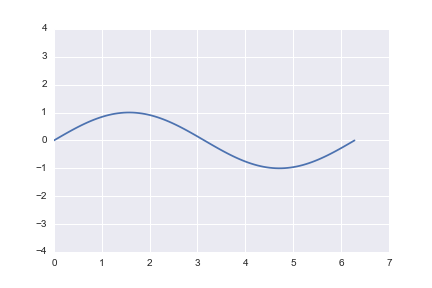

In [175]:
# set up plot
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_ylim([-4, 4])
ax.grid(True)
 
# generate x values
x = np.linspace(0, 2 * np.pi, 100)
 

def my_sine(x, w, amp, phi):
    """
    Return a sine for x with angular frequeny w and amplitude amp.
    """
    return amp*np.sin(w * (x-phi))
 

@widgets.interact(w=(0, 10, 1), amp=(0, 4, .1), phi=(0, 2*np.pi+0.01, 0.01))
def update(w = 1.0, amp=1, phi=0):
    """Remove old lines from plot and plot new one"""
    [l.remove() for l in ax.lines]
    ax.plot(x, my_sine(x, w, amp, phi), color='C0')

In [176]:
#tekrar inline yapalım
%matplotlib inline

#### Örnekler

https://matplotlib.org/stable/gallery/index.html

## Seaborn

Seaborn kütüphanesi de çok sayıda grafik türü sunmkata, buraya önemli olduğunu düşündüklerimi aldım. https://seaborn.pydata.org/api.html sayfasından bu grafiktürlerinin kategorizasyonunu görebilirsiniz.

### barplot v.s

bunların matplotlibden çok büyük bir farkı bulunmuyor, ancak daha şık bir görsellik sunarlar.

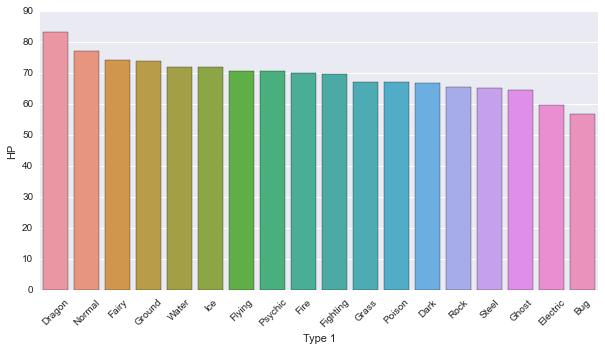

In [177]:
gruplu=dfp.groupby("Type 1")["HP"].mean().sort_values(ascending=False)

plt.figure(figsize=(10,5))
sns.barplot(x=gruplu.index, y=gruplu.values)
plt.xticks(rotation= 45) #isimler uzun olursa horizontalalignment='right' da ekle
plt.xlabel('Type 1')
plt.ylabel('HP')
plt.show();

Kategorik veriler bazında adetleri saydırmak için <b>countplot</b> kullanılır.

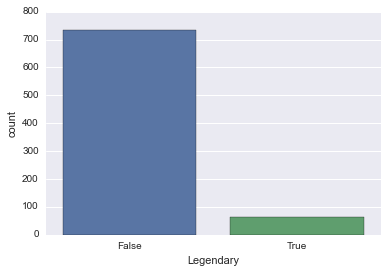

In [178]:
ax = sns.countplot(x=dfp['Legendary'],label="Count") #matplotlib'de groupby yapıp count almanın alternatifi

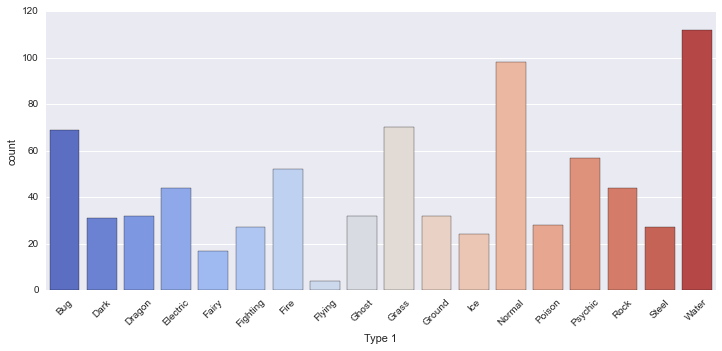

In [179]:
#count ettiğimiz gruplu alanı belli bi sıraya göre dizmek istersek order parametresini veririz
plt.figure(figsize=(12,5))
order = sorted(dfp['Type 1'].unique())
sns.countplot(x='Type 1',data=dfp,order = order,palette='coolwarm')
plt.xticks(rotation= 45);

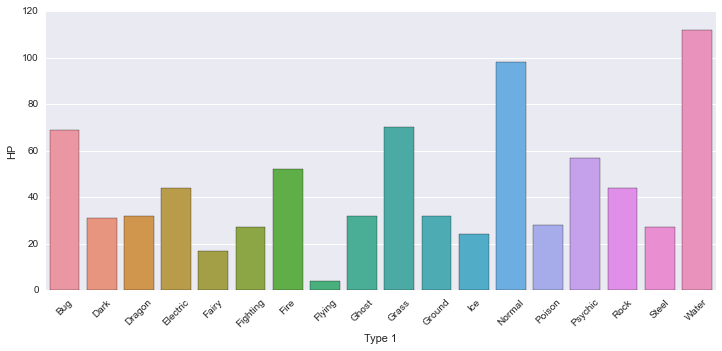

In [180]:
#bunu normal barplotla yapsaydık şöyle yapardık
gruplu=dfp.groupby("Type 1")["HP"].count() #HP önemli değil, herhangi bir kolon da olurdu

plt.figure(figsize=(12,5))
sns.barplot(x=gruplu.index, y=gruplu.values)
plt.xticks(rotation= 45) #isimler uzun olursa horizontalalignment='right' da ekle
plt.xlabel('Type 1')
plt.ylabel('HP')
plt.show();

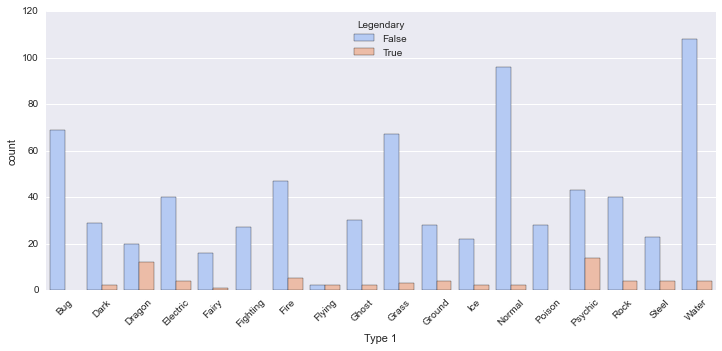

In [181]:
#countplotu bir de başka bir kolona göre de kıralım
plt.figure(figsize=(12,5))
order = sorted(dfp['Type 1'].unique())
sns.countplot(x='Type 1',data=dfp,order = order,palette='coolwarm', hue="Legendary")
plt.xticks(rotation= 45);

### scatterplot

<AxesSubplot:xlabel='Speed', ylabel='HP'>

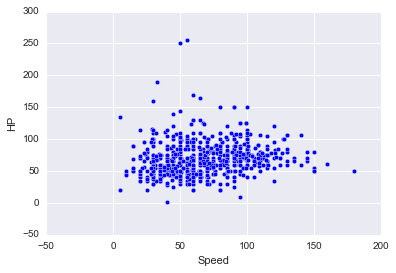

In [182]:
sns.scatterplot(x=dfp['Speed'],y=dfp['HP'])

Her ne kadar noktalar iki boyut üzerine çizilse de, renk değeri de kullanılarak sanal bir üçüncü boyut eklenebilir. Bunun için "hue" parametresi kullanılır.

Değişkenler arasındaki farklılığı vurgulamak için "style" parametresi kullanılarak markerlar da farklılaştırılabilir.

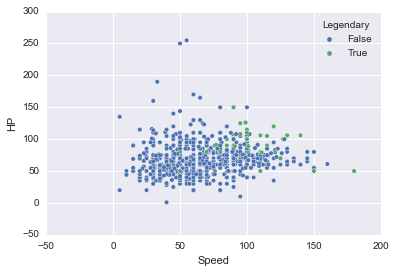

In [183]:
sns.scatterplot(x='Speed',y='HP',hue='Legendary',data=dfp);

### displot

Tek bir değişkenin dağılımına bakmanın en uygun yolu displot kullanmaktır.

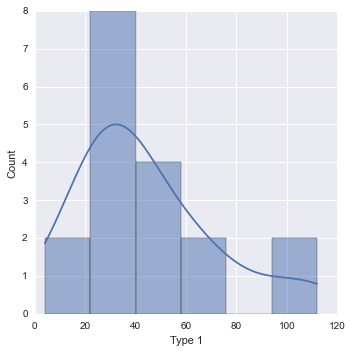

In [184]:
x=dfp["Type 1"].value_counts()
sns.displot(x,kde=True); #hist ve kde karışımını verir

### heatmap

bu grafik türü ile kolonlar arası korelasyonu çok güzel bir şekilde görürüz

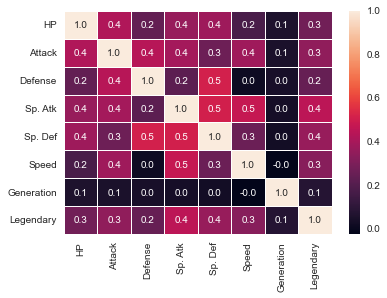

In [185]:
sns.heatmap(dfp.corr(),annot=True, linewidths=.5,fmt='.1f');

In [186]:
#örnek 2:
tip1legend = (dfp
            .groupby('Type 1')
            .filter(lambda x : len(x) > 50)
            .groupby(['Type 1', 'Legendary'])
            .size()
            .unstack()
           )
tip1legend

Legendary,False,True
Type 1,,
Bug,69.0,NaN
Fire,47.0,5.0
Grass,67.0,3.0
Normal,96.0,2.0
Psychic,43.0,14.0
Water,108.0,4.0


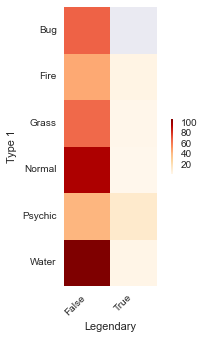

In [187]:
plt.figure(figsize=(5,5))
h = sns.heatmap(
    tip1legend, 
    square=True, 
    cbar_kws={'fraction' : 0.01}, 
    cmap='OrRd', 
    #linewidth=1
)

h.set_xticklabels(h.get_xticklabels(), rotation=45, horizontalalignment='right')
h.set_yticklabels(h.get_yticklabels(), rotation=0)
plt.show();

Pandas'ın corr metodunu numerik kolonlar üzerinde kullanıyoruz. Eğer elimizde kategorik verilerin olduğu bir alan olsaydı, bunlar için önce factorize metdounu çalıştırmak gerekirdi. <a href="https://stackoverflow.com/questions/48035381/correlation-among-multiple-categorical-variables-pandas">şu sayfada</a> güzel bir örnek bulunuyor.

### violinplot

Boxplota benzerler, aslında boxplot ile KDE grafiğinin bir karışımıdır diyebiliriz. Bir diğer artısı ise, çok tepeli KDE histogram verisini de KDE'den dolayı daha iyi gösterir. Bu grafik türüyle ilgili detay bilgiye <a href="https://blog.bioturing.com/2018/05/16/5-reasons-you-should-use-a-violin-graph/">buradan</a> ve <a href="https://towardsdatascience.com/violin-plots-explained-fb1d115e023d">buradan</a> ulaşabilirsiniz.

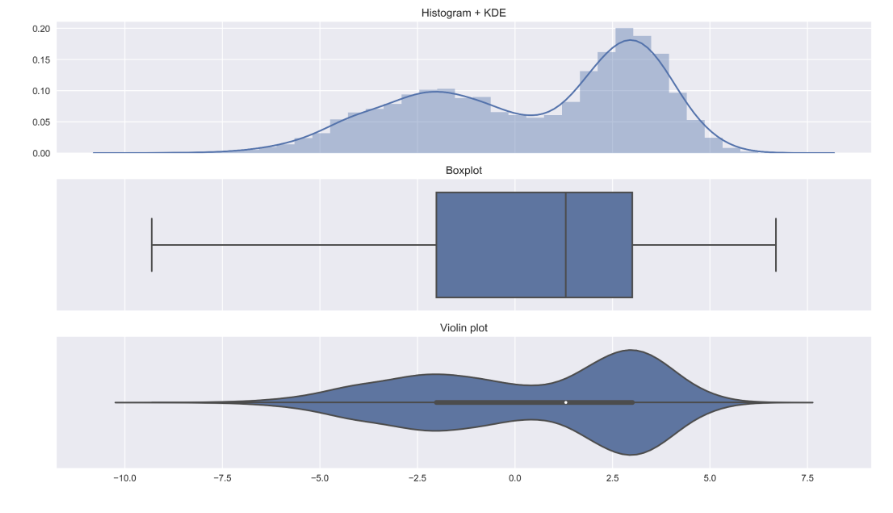

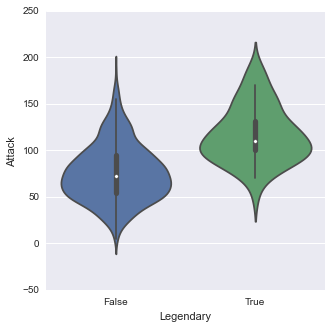

In [189]:
plt.figure(figsize=(5,5))
ax = sns.violinplot(x="Legendary", y="Attack", data=dfp);

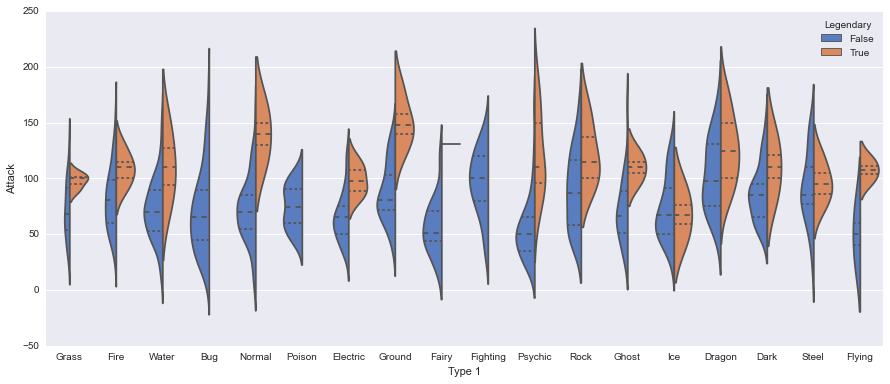

In [191]:
plt.figure(figsize=(15,6))
ax = sns.violinplot(x="Type 1", y="Attack", hue="Legendary", data=dfp, palette="muted", split=True, inner="quart") ;
#inner parametre ile şekillerin içinde quartilleları gösteriyoruz, split parametresi ise Legendary değrlerini tek grafikte gösteriyor

Yorum: Medianlar Ice dışındakilerde birbirinden çok ayrı, dolayısıyla Ice dışındakilere giren birinin sınıfını tahmin etmek oldukça kolay.

### boxplot

Boxplot ile de benzer bir görüntü sağlanabilir. matplotlibin boxplotından daha şık bir görüntü sağlar.

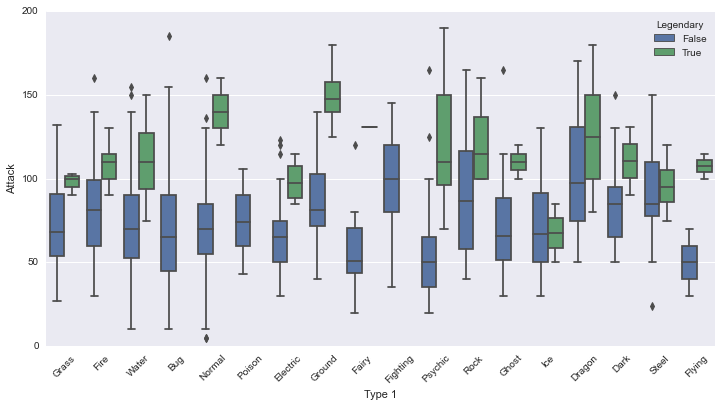

In [192]:
plt.figure(figsize=(12,6))
chart=sns.boxplot(x="Type 1", y="Attack", hue="Legendary", data=dfp) #kategorik bir feature kırılımı,üstelik Lengendary bazında
#plt.xticks(rotation=45)
chart.set_xticklabels(chart.get_xticklabels(),rotation=45) #isimler uzun olursa horizontalalignment='right' da ekle
plt.show();

### boxplot vs violinplot vs KDE

In [193]:
def plot_comparison(x, title):
    fig, ax = plt.subplots(3, 1, sharex=True, figsize=(6,6))
    sns.histplot(x=x, ax=ax[0])
    ax[0].set_title('Histogram + KDE')
    sns.boxplot(x=x, ax=ax[1])
    ax[1].set_title('Boxplot')
    sns.violinplot(x=x, ax=ax[2])
    ax[2].set_title('Violin plot')
    fig.suptitle(title, fontsize=16)
    plt.show()

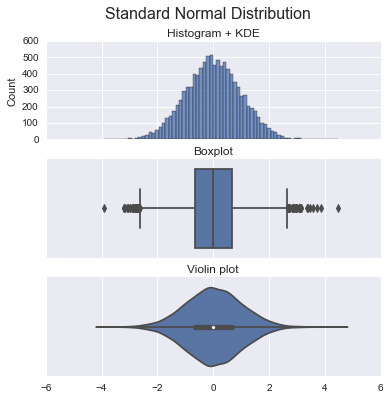

In [194]:
sample_gaussian = np.random.normal(size=10000)
plot_comparison(sample_gaussian, 'Standard Normal Distribution')

### jointgrid&jointplot

Hem tek hem iki değişken durumunda daha derin inceleme yapma amacıyla jointplot kullanırız. Detay bilgi için <a href="https://medium.com/@neuralnets/data-visualization-with-python-and-seaborn-part-5-scatter-plot-joint-plot-d7312164dc32">buraya</a> bakınız.

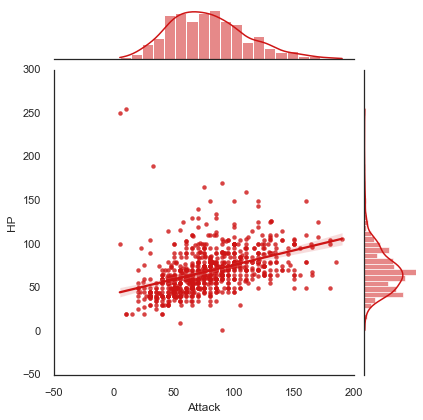

In [195]:
import scipy.stats as stats
sns.set(style="white")
sns.jointplot(x='Attack', y='HP', data=dfp, kind="reg", color="#ce1414"); #.annotate(stats.pearsonr)

### Catplot(Factorplot)

Bu grafik türü ile belirli bir feature göre gruplama yapılıyor. Böylece ayrı bir gruplama işlemine gerek kalmıyor. Default gruplama işlemi "ortalama"dır

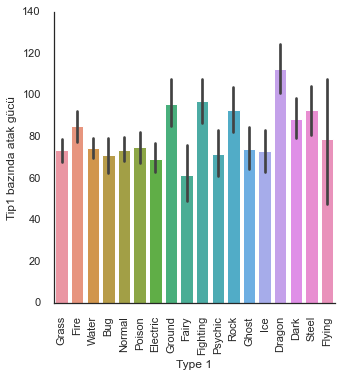

In [196]:
g=sns.catplot(x="Type 1",y="Attack",data=dfp,kind="bar"); #eski adı factorplot
g.set_ylabels("Tip1 bazında atak gücü");
plt.xticks(rotation= 90);

Kind=bar olduğunda errorbarlar da görünmekte. Bu sayede Flying tipinde varyansın da yüksek olduğunu görebiliyoruz.

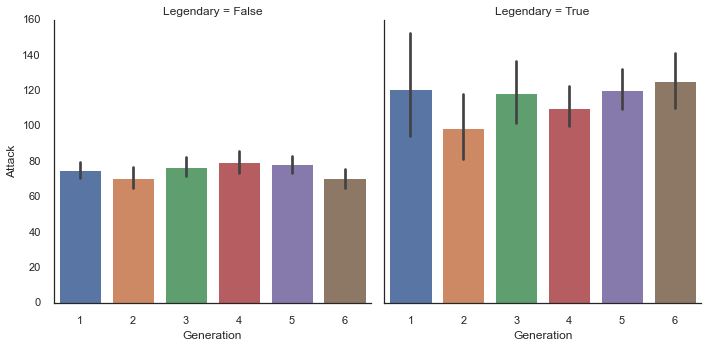

In [197]:
#bir featureda 2-3 değer varsa bunları ayrı ayrı kolonlarda gösterebiliriz
g = sns.catplot(x="Generation", y="Attack", col="Legendary", data=dfp, kind="bar")

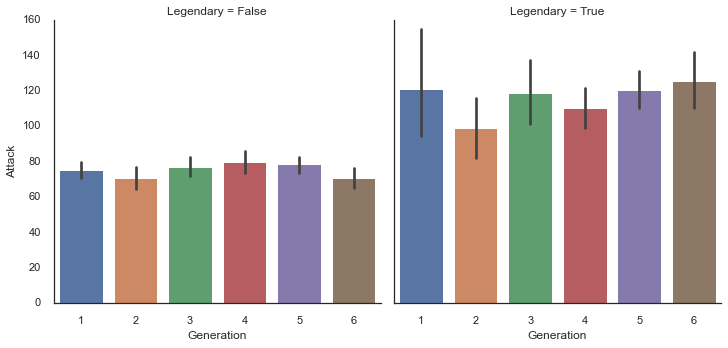

In [198]:
#Başka bir kategoryie göre ...........çok fazla kategori varsa bi sırada x adet plot olsun diyebiliriz
g = sns.catplot(x="Generation", y="Attack", col="Legendary", data=dfp, kind="bar", col_wrap=3)

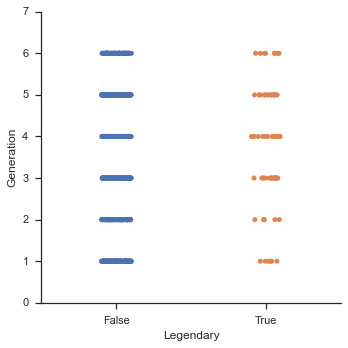

In [199]:
sns.set_theme(style="ticks")
g=sns.catplot(x="Legendary",y="Generation", data=dfp)

### pairplot & pairgrid

pandas.plotting'deki scatter_matrix'e benzer, daha yavaştır. İki dğeişkenin scatter grafiğini çizerken, aynı zamanda köşegenler üzerinde ilgili değişkenin histogramını da verir.

In [200]:
#çok karışık bir tabloyla karşılaşmayalım diye sadece belirli kolonları seçiyorum
dfx = dfp.loc[:,['Type 1','HP','Attack','Speed']]

pairplot kullanımı oldukça basittir.

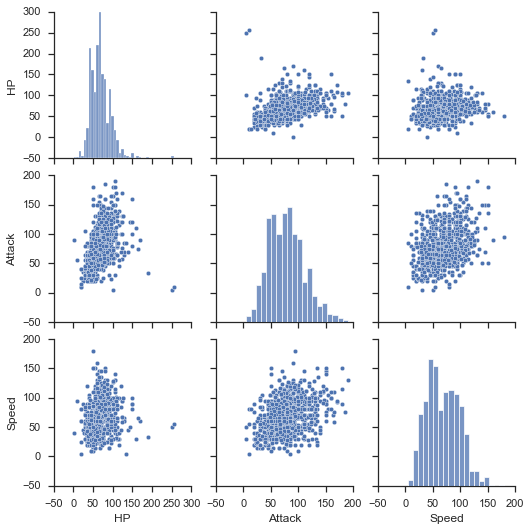

In [201]:
sns.pairplot(dfx);

ML çalışmalarında X'lerin y ile ilişkisine bakmak istersek x_vars ve y_vars parametrelerini kullanırız. Biz örnek olarak x'ler için HP ve Atak'ı alalım, Speed'e de y diyelim.

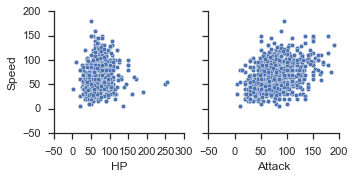

In [202]:
sns.pairplot(dfx,x_vars=dfx.iloc[:,1:3].columns,y_vars="Speed");

büyük rakamlar sözkonusu olduğunda 10 tabanında logaritma alınarak da incelemeler yapılabilmektedir.

In [ ]:
#çok kalabalık görünmesin diye G ve D ile başlayanları alıyorum
dfx.select_dtypes(np.number).apply(lambda x: np.log10(x))
sns.pairplot(dfx[dfx['Type 1'].str.startswith('G')], 
             hue='Type 1',plot_kws = {'alpha': 0.8, 's': 40, 'edgecolor': 'k'});

pairplotta default parametereler sözkonusu iken pairgridde ise nelerin çizileceğini biz söyleriz. Üç hedef bölge var: sol alttaki üçgen, sağ üstteki üçgen ve köşegen.

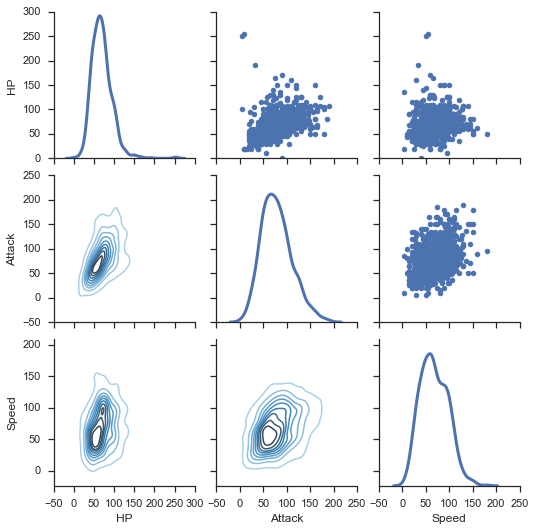

In [203]:
g = sns.PairGrid(dfx, diag_sharey=False);
g.map_lower(sns.kdeplot, cmap="Blues_d");
g.map_upper(plt.scatter);
g.map_diag(sns.kdeplot, lw=3);

Daha detaylı bir makale şurada bulunmakta: https://towardsdatascience.com/visualizing-data-with-pair-plots-in-python-f228cf529166

### FacetGrid

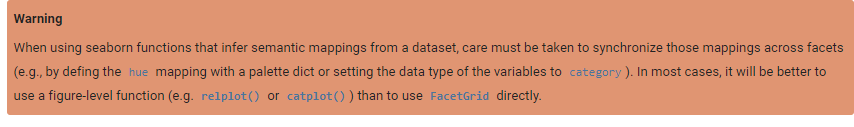

Farklı boyutları farklı gridlerde göstermek istersek FacetGrid kullanabiliriz.

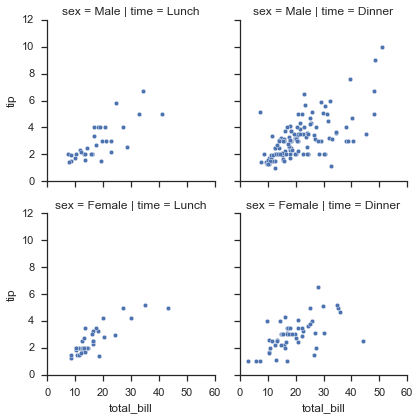

In [204]:
tips = sns.load_dataset("tips")
g = sns.FacetGrid(tips, col="time", row="sex") #genelde öncelikle böyle bir nesne elde edilir
g.map(sns.scatterplot, "total_bill", "tip");  #sonra da map ile uygun chart çizdirilir

Başka bir Facetgrid döndüren(figure-level olan) grafik türüyle kullanmamak gerekeblir. Mesela displot, catplot gibi. Bunun yerine bunların altında yatan uygun grafik türünü kullanın.

c:\users\volka\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2211: UserWarning: `displot` is a figure-level function and does not accept the ax= paramter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)
c:\users\volka\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2211: UserWarning: `displot` is a figure-level function and does not accept the ax= paramter. You may wish to try histplot.
  warnings.warn(msg, UserWarning)


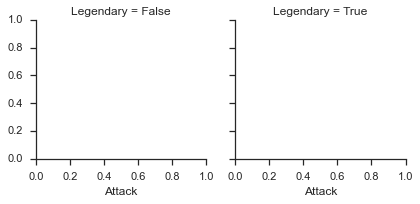

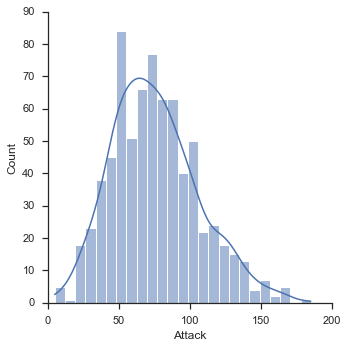

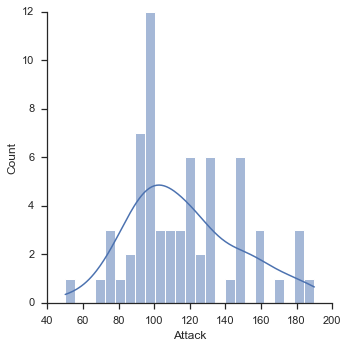

In [205]:
#Mesela bu örnekte çıktımız hiç de istendiği gibi değil
g=sns.FacetGrid(dfp,col="Legendary")
g.map(sns.displot,"Attack",bins=25,kde=True)

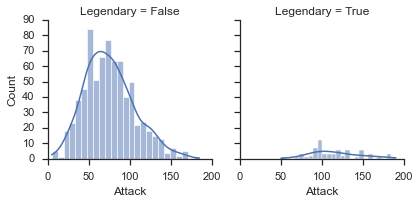

In [206]:
#displot yerine onun altındaki histplot'u kullanmak gerekiyor
g=sns.FacetGrid(dfp,col="Legendary")
g.map(sns.histplot,"Attack",bins=25,kde=True)

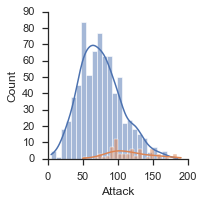

In [207]:
#col yerine hue dersek, farklı grafikler yerine aynı grafikte fakat farklı renkte gösterir
g=sns.FacetGrid(dfp,hue="Legendary")
g.map(sns.histplot, "Attack",bins=25, kde=True)
plt.show()

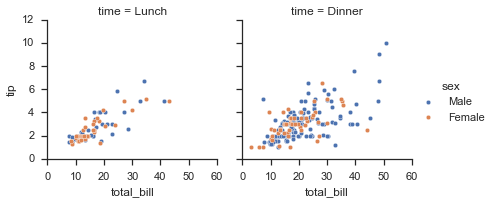

In [208]:
g = sns.FacetGrid(tips, col="time", hue="sex")
g.map_dataframe(sns.scatterplot, x="total_bill", y="tip")
g.add_legend();

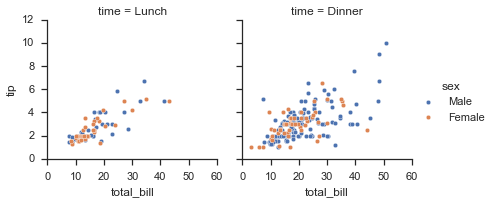

In [209]:
#taibiki hepsi birarada kullanılabilir
g = sns.FacetGrid(tips, col="time", hue="sex")
g.map_dataframe(sns.scatterplot, x="total_bill", y="tip")
g.add_legend();

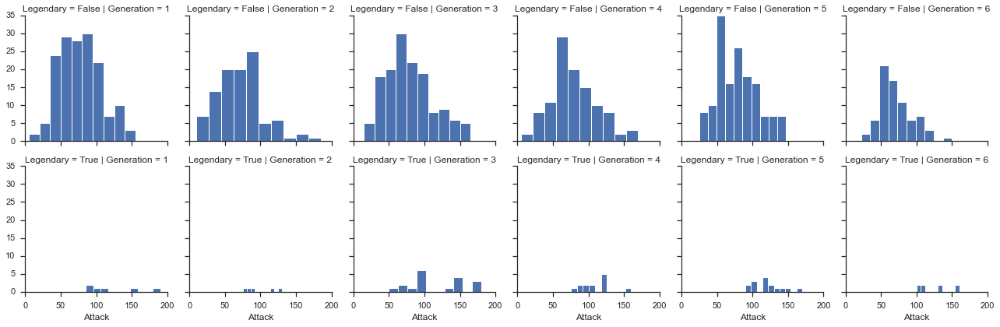

In [210]:
g=sns.FacetGrid(dfp,row="Legendary",col="Generation")
g.map(plt.hist, "Attack",bins=10);

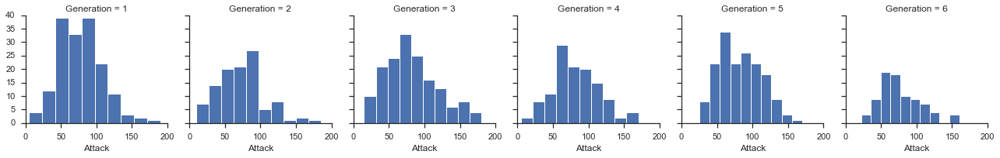

In [211]:
g=sns.FacetGrid(dfp,col="Generation")
g.map(plt.hist, "Attack",bins=10);

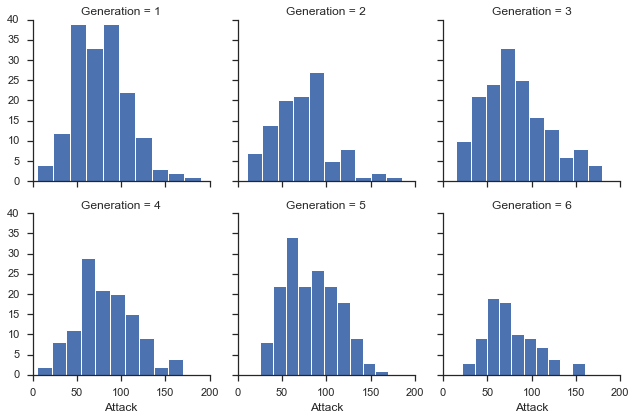

In [212]:
g=sns.FacetGrid(dfp,col="Generation",col_wrap=3)
g.map(plt.hist, "Attack",bins=10);

### regplot ve lmplot

Bunların ikisi de regresyon çizgisi olan scatter plot çizerler. ancak regplot() sadece tek bir regresyon ilişkisi kurarken, lmplot arkaplanda facetgrid sayesinde kategorik bouyltara göre de kırılım yapabilir. Bunları özellikle ML çalışmaları sırasında bi regresyon analiz yaptıysanız kullanmak mantıklı olacaktır.

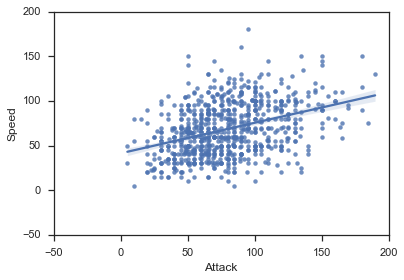

In [214]:
sns.regplot(x='Attack',y='Speed',data=dfp);

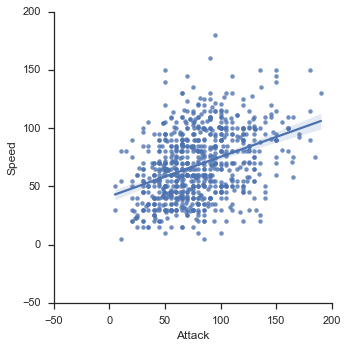

In [215]:
sns.lmplot(x='Attack',y='Speed',data=dfp);

İkisi de aslında aynı sonucu verdi ancak şeklen bir fark sözkonusu gibi. Bu farkın sebebi bence çok kritik değil ama merak edenler https://seaborn.pydata.org/tutorial/regression.html sayfasında "Controlling the size and shape of the plot" başlığında bulabilir. Biz şimdi lmplotun FacetGrid sayesindeki daha zengin kulanımına bakalım.

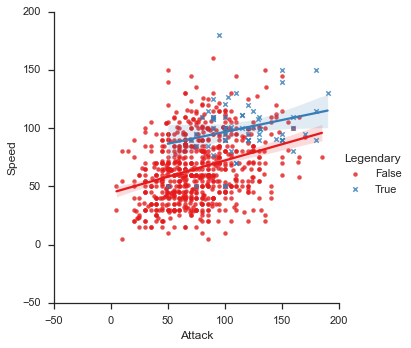

In [216]:
sns.lmplot(x='Attack',y='Speed',hue='Legendary',data=dfp, markers=["o", "x"], palette="Set1");

### Seaborn diğer hususlar

#### Genel bilgiler

https://seaborn.pydata.org/api.html sayfasında genel grafik türlerine bakabilir, temalar/renk plaetleri ve utility fonksiyonları hakkında bilgiler bulabilirsiniz.

https://seaborn.pydata.org/tutorial/function_overview.html sayfasında fonksiyonlar hakkında temel bilgileri ediebilrisiniz.

Bazı sınıflar/fonksiyonlar ax seviyesinde chart çizerken bazıları figure seviyesinde çizer. MEsela aşağıdaki 3 fonksiyon, arka planada altlarındaki grafik türlerinden birini kullanır ve bunları bir **Facetgridde**(çoğunlukla bu) gösterir. Çoğu özellikleri bu yüzden aynıdır, ama figure-level fonksiyonların bazı farkları bulunur.

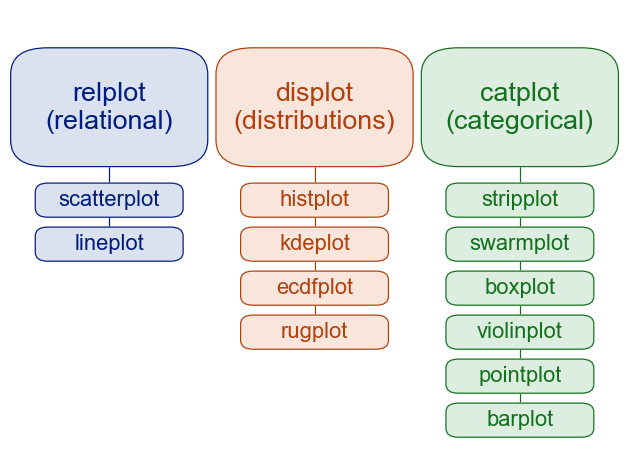

Bu farkları şöyle sıralayabiliriz.

- Bunlarda legendlar grafiğin dışındadır.
- Stack şeklinde sunum yapmak yerine subplot şeklinde gösterim

<AxesSubplot:xlabel='flipper_length_mm', ylabel='Count'>

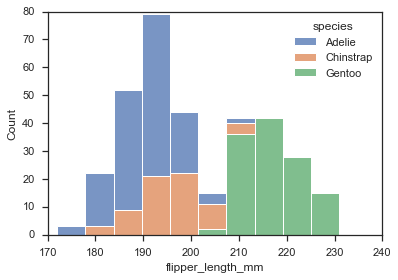

In [217]:
penguins = sns.load_dataset("penguins")
sns.histplot(data=penguins, x="flipper_length_mm", hue="species", multiple="stack")

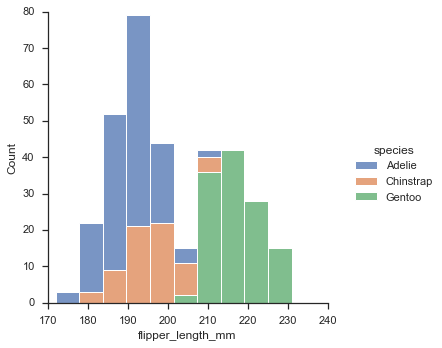

In [218]:
#yukarıdaki displotun aynısı ama tek fark legend dışarda
sns.displot(data=penguins, x="flipper_length_mm", hue="species", multiple="stack")

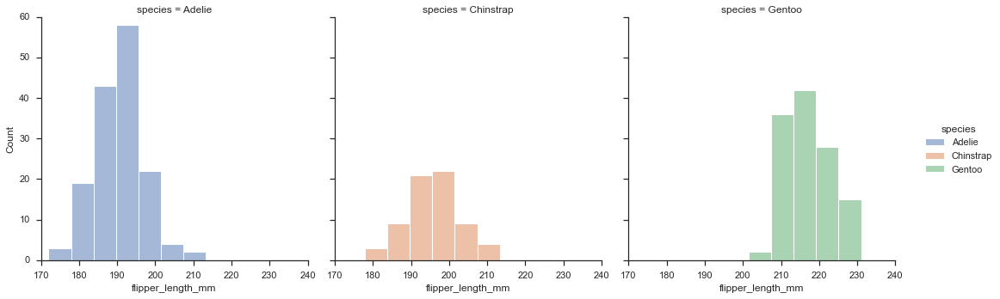

In [219]:
# hadi şimdi bunu stackli göstermek yerine subplot şeklinde gösterelim
sns.displot(data=penguins, x="flipper_length_mm", hue="species", col="species");

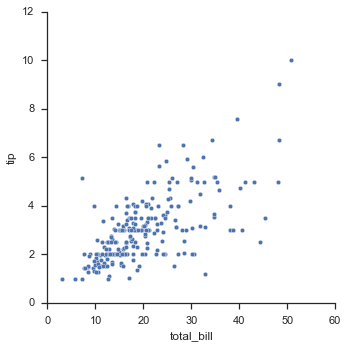

In [220]:
tips = sns.load_dataset("tips")
g = sns.relplot(data=tips, x="total_bill", y="tip")

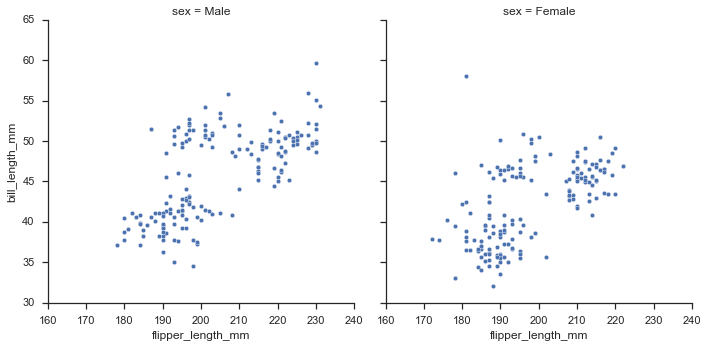

In [221]:
g = sns.relplot(data=penguins, x="flipper_length_mm", y="bill_length_mm", col="sex")

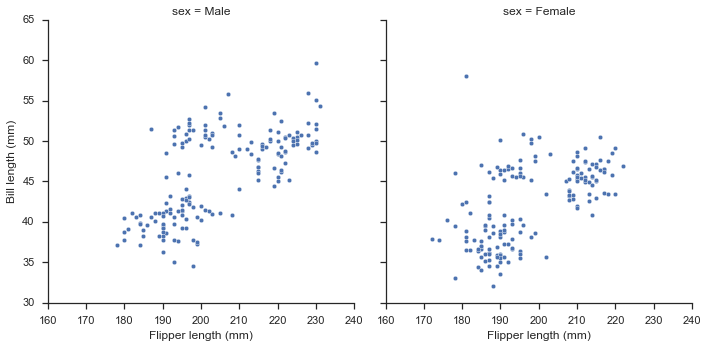

In [222]:
g = sns.relplot(data=penguins, x="flipper_length_mm", y="bill_length_mm", col="sex")
g.set_axis_labels("Flipper length (mm)", "Bill length (mm)"); #labelları customize
# label size??????

In [223]:
sns.set()
sns.set_style('darkgrid')
sns.set_context("paper", rc={"axes.labelsize":22})

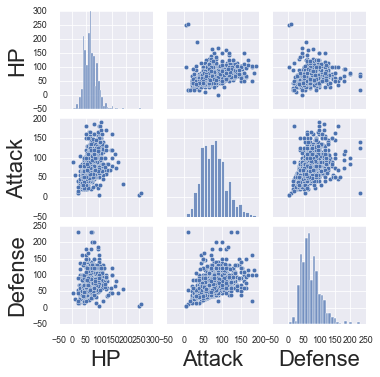

In [227]:
sns.pairplot(dfp[dfp.select_dtypes("number").columns[:3]])
plt.gcf().set_size_inches(5,5);

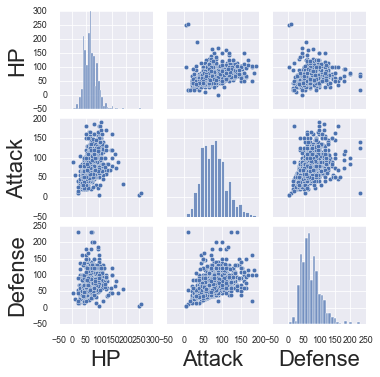

In [228]:
# veya
g=sns.pairplot(dfp[dfp.select_dtypes("number").columns[:3]])
g.fig.set_size_inches(5,5)

#### figuresize

Özet bilgi:ax-level olanlar için matplotlibdeki gibi, figure-level olanlar için height ve aspect parametreleri kullanılır.

Detay bilgi:https://seaborn.pydata.org/tutorial/function_overview.html#specifying-figure-sizes

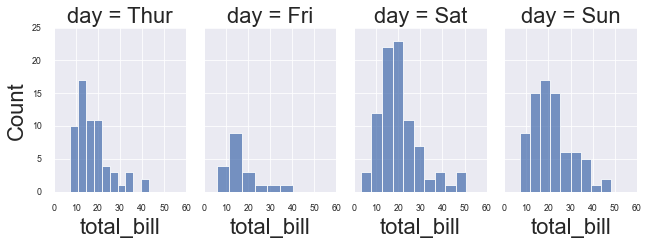

In [229]:
tips = sns.load_dataset("tips")
g = sns.FacetGrid(tips, col="day", height=3.5, aspect=.65) #Facet genişliği height'ın %65i olacak
g.map(sns.histplot, "total_bill")

#### map function

Bazı grafik sınıfları/metodları(FacetGrid, PairGrid gibi) ilgili grafiği çizdirdiği gibi altta yatan bu grafiği de döndürür ve bunu bi değişkende depolayıp üzerinde işlem yapabilirsiniz.

- FacetGrid.map:Apply a plotting function to each facet’s subset of the data.
- PairGrid.map:Plot with the same function in every subplot.

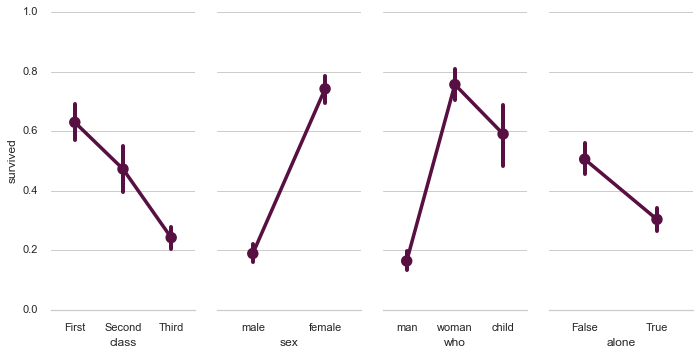

In [231]:
import seaborn as sns
sns.set_theme(style="whitegrid")

# Load the example Titanic dataset
titanic = sns.load_dataset("titanic")

# Set up a grid to plot survival probability against several variables
g = sns.PairGrid(titanic, y_vars="survived",
                 x_vars=["class", "sex", "who", "alone"],
                 height=5, aspect=.5)

# Draw a seaborn pointplot onto each Axes
g.map(sns.pointplot, scale=1.3, errwidth=4, color="xkcd:plum")
g.set(ylim=(0, 1))
sns.despine(fig=g.fig, left=True);

#### Full tutorial

https://seaborn.pydata.org/tutorial

## Diğer görselleştirme kütüphaneleri 

Matplotlib ve Seaborn dışında kullanılan başka kütüphaneler de var. Plotly ve Bokeh gibi. Bunları detaylı incelemeyi size bırakıyorum. Aşağıda sadece bir iki ufak örnek bulacaksınız.

###  Plotly

In [232]:
#pip install plotly #önce kurmanız gerekiyor

In [233]:
#Plotly'nin güzelliği üzerine gelindiğinde çeşitli bilgiler sunması
import plotly.graph_objs as go
seri=dfp["Type 1"].value_counts()
data = {
  'x': seri.index,
  'y': seri.values,
  'name': 'citation',
  'type': 'bar'
};

fig = go.Figure(data = data)
fig.show()

In [234]:
#plotlyde animasyonlu grafikler de çizdirebiliyorsunuz
import plotly.express as px
df = px.data.gapminder()
px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

### Altair

https://altair-viz.github.io/

In [235]:
#pip install altair
#pip install vega_datasets

In [236]:
import altair as alt
from vega_datasets import data
cars = data.cars()

In [237]:
alt.Chart(cars).mark_circle().encode(
    x='Horsepower:Q',
    y='Miles_per_Gallon:Q',
    color='Cylinders:O'
)

alt.Chart(...)

In [238]:
alt.Chart(cars).mark_bar().encode(
    x=alt.X('Miles_per_Gallon', bin=alt.Bin(maxbins=30)),
    y='count()',
    color='Origin',
    column='Origin'
).properties(
    width=250
)

alt.Chart(...)

In [239]:
line_base = alt.Chart(cars).mark_line().encode(
    x='Year',
    y='mean(Miles_per_Gallon)'
)

points = alt.Chart(cars).mark_point().encode(
    x='Year',
    y='mean(Miles_per_Gallon)'
)



In [240]:
line_base + points

alt.LayerChart(...)

In [241]:
line_base | points

alt.HConcatChart(...)

In [242]:
sol = alt.Chart(cars).mark_point().encode(
    x='Miles_per_Gallon',
    y='Horsepower',
    color="Origin"
)

sag = alt.Chart(cars).mark_point().encode(
    x='Acceleration',
    y='Horsepower',
    color="Origin"
)


alttaki= alt.Chart(cars).mark_bar().encode(
    y='Origin',
    x='count()',
    color="Origin"    
).properties(
    width=850,
    height=100
)

(sol | sag) & alttaki


alt.VConcatChart(...)

In [243]:
#mouse ile belli bi bölgeyi seçin
interval = alt.selection_interval()

left=alt.Chart(cars).mark_point().encode(
    x='Miles_per_Gallon',
    y='Horsepower',
    # add that selection for color assignments
    color=alt.condition(interval, 'Origin', alt.value('lightgray'))
).add_selection(
    interval
)

right=alt.Chart(cars).mark_point().encode(
    x='Acceleration',
    y='Horsepower',
    # add that selection for color assignments
    color=alt.condition(interval, 'Origin', alt.value('lightgray'))
).add_selection(
    interval
)

left | right

alt.HConcatChart(...)

### wordcloud

In [ ]:
#pip install wordcloud 

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

(-0.5, 511.5, 383.5, -0.5)

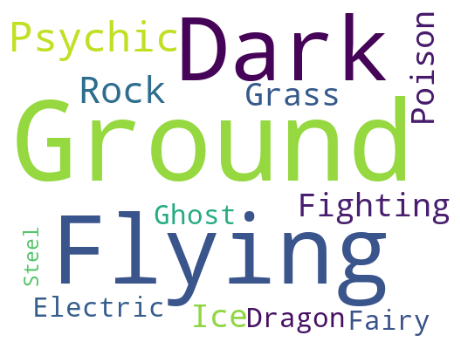

In [244]:
from wordcloud import WordCloud

tip2ler = dfp["Type 2"][(dfp["Type 1"]=="Water") & (dfp["Type 2"].notna())].values
#print(tip2ler)
plt.subplots(figsize=(8,8))
wordcloud = WordCloud(
                          background_color='white',
                          width=512,
                          height=384
                         ).generate(" ".join(tip2ler))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('graph.png')
plt.show()
#her çalışıtırmada renkler ve konumlar dğeişiyor ama büyüklükler dğeişmez

Bu grafikler medium giib platformalrda veya websitelerinde de interaktif bir şekilde paylaşılabiliyor. Nasıl yapıldığını görmek için <a href="https://towardsdatascience.com/how-to-create-a-plotly-visualization-and-embed-it-on-websites-517c1a78568b">tıklayınız</a>

### folium

In [ ]:
# !pip install folium

In [245]:
import folium
m = folium.Map(location=[41,29], zoom_start=12)

tooltip = "Click me!"

folium.Marker(
    [41.046, 29.03359], popup="<i>Boğaziçi Köprüsü</i>", tooltip=tooltip
).add_to(m)
folium.Marker(
    [41.039, 28.987], popup="<b>Gezi Parkı</b>", tooltip=tooltip
).add_to(m)

m

### scikit-learn'e ait libraryler

- https://scikit-plot.readthedocs.io/en/stable/index.html : veri bilimi tarafındaki çıktılarınızı görselleştirmek için kullanılır.
- https://scikit-image.org/ : image processing amaçlı kullanılır.

## Grafik seçimi

Üç aşağı beş yukarı, hangi grafik türünü ne zaman kullanmanız gerektiğini anlamış olmalısınız. Ben yine de camiada çok kullanılan bir yönlendirici <a href='https://extremepresentation.typepad.com/files/choosing-a-good-chart-09.pdf'>şemayı </a> sizle paylaşma isterim.

# Data nasıl incelenir, nereden başlanır

Buraya kadar veri bilimine ait kaydadeğer miktarda bilgi edinmiş oldunuz. Güzel, ancak bunları elinizdeki veri setine nasıl uygulayacağınız konusunda kafanız karışmış olabilir. İşte bunları hangi sırayla uygulayacağınıza dair yöntemler **(`EDA ve preprocessing`)** bulunmaktadır. Bunlara ait detaylı bilgiyi <a href="https://mvolkanyurtseven.medium.com/makine-%C3%B6%C4%9Frenimi-felsefesi-5-78cd290b46f2">şurdaki</a> medium gönderismde bulabilirsiniz.

# Alıştırmalar

Pek yakında...